In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import re
import pickle

%matplotlib inline 
import warnings
warnings.filterwarnings('ignore')

In [122]:
%matplotlib inline
import pickle
#%run helper_loans.py
pd.options.display.max_columns = 1000
plt.rcParams["figure.figsize"] = (15,10)
from datetime import datetime

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.dummy import DummyClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn import metrics
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import classification_report, f1_score, accuracy_score, precision_score, confusion_matrix, log_loss
from sklearn.pipeline import Pipeline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold, train_test_split, cross_val_predict
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix, roc_curve, auc
from sklearn.externals import joblib


import plotly.plotly as py
import plotly.graph_objs as go

In [4]:
import xgboost as xgb


In [5]:
def pickle_(obj, name):
    with open(name+".pkl", 'wb') as f:
        pickle.dump(obj, f, protocol=4)

In [6]:
import pickle
def unpickle_(pkl):
    return pickle.load(open(pkl, 'rb'))

# Model Tuning

## Dummy Classifier for final 28 test

In [108]:
df_test = unpickle_("df_test_final_real1.pkl")

In [115]:
df_test.shape

(164680, 27)

In [116]:
model = DummyClassifier(strategy = "stratified", random_state=0)
model.fit(X_train_scaled,y_train)
model.score(X_test_scaled,y_test)

0.5257226135535584


             precision    recall  f1-score   support

 Fully Paid       0.40      0.39      0.39     16201
       Late       0.61      0.61      0.61     24969

avg / total       0.53      0.53      0.53     41170


Accuracy Score:  0.5267427738644644

F1 score - Binary:  0.611779708296804

F1 score - Micro:  0.5267427738644644

F1 score - Weighted:  0.526081563563143

Log_loss:  16.345917146132706



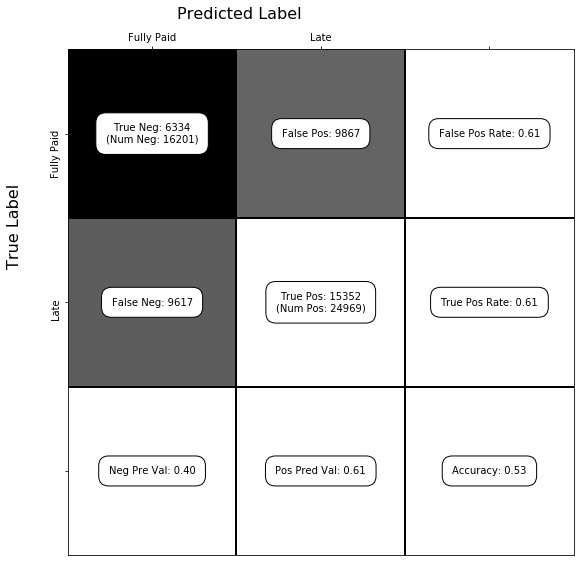

In [120]:
    model = DummyClassifier(strategy = "stratified", random_state=0)
    y_pred = cross_val_predict(model, X_test_scaled, y_test, cv=cv, n_jobs=-1)
    print()
    print(classification_report(y_test, y_pred,target_names=target_names))
    print()
    cnf_matrix = confusion_matrix(y_test, y_pred)
    print("Accuracy Score: ", np.median(accuracy_score(y_test, y_pred)))
    print()
    print("F1 score - Binary: ", np.median(f1_score(y_test, y_pred, average='binary')))
    print()
    print("F1 score - Micro: ", np.median(f1_score(y_test, y_pred, average='micro')))
    print()
    print("F1 score - Weighted: ", np.median(f1_score(y_test, y_pred, average='weighted')))
    print()
    print("Log_loss: ", metrics.log_loss(y_test, y_pred))
    print()
    show_confusion_matrix(cnf_matrix, class_labels=target_names)

In [105]:
df_test.loan_status_Late.unique()

array([1, 0], dtype=uint64)

In [25]:
'''If your training set is small, high bias/low variance classifiers (e.g., Naive Bayes) have an advantage over low bias/high variance classifiers (e.g., kNN), since the latter will overfit. But low bias/high variance classifiers start to win out as your training set grows (they have lower asymptotic error), since high bias classifiers aren’t powerful enough to provide accurate models.

'''

'If your training set is small, high bias/low variance classifiers (e.g., Naive Bayes) have an advantage over low bias/high variance classifiers (e.g., kNN), since the latter will overfit. But low bias/high variance classifiers start to win out as your training set grows (they have lower asymptotic error), since high bias classifiers aren’t powerful enough to provide accurate models.\n\n'

In [101]:
df_test.head()

,int_rate,dti,term_ 60 months,bc_open_to_buy,revol_util,installment,avg_cur_bal,tot_hi_cred_lim,revol_bal,tot_cur_bal,loan_amnt,mo_sin_old_rev_tl_op,total_bal_ex_mort,total_acc,mo_sin_old_il_acct,mths_since_recent_bc,acc_open_past_24mths,mo_sin_rcnt_tl,mo_sin_rcnt_rev_tl_op,mths_since_last_delinq,mths_since_recent_inq,num_bc_tl,annual_inc,fico_range_low,fico_range_high,il_util,max_bal_bc
0,12.74,18.60,0,721.0,60.0,503.54,3701.0,31132.0,7262.0,22207.0,15000.0,120.0,22207.0,17.0,145.0,29.0,1.0,16.0,29.0,17.0,16.0,3.0,36000.0,670.0,674.0,79.0,6628.0
1,13.99,16.37,1,16247.0,23.8,488.53,3725.0,87847.0,7911.0,52144.0,21000.0,133.0,52144.0,28.0,143.0,28.0,6.0,11.0,24.0,999.0,9.0,6.0,115000.0,665.0,669.0,81.0,3215.0
2,13.67,3.71,0,4398.0,60.4,608.92,35763.0,310745.0,9900.0,250341.0,17900.0,109.0,9900.0,24.0,113.0,26.0,3.0,2.0,6.0,39.0,2.0,12.0,86000.0,675.0,679.0,73.0,4379.0
3,15.31,9.03,0,1989.0,56.2,348.18,1516.0,21161.0,8940.0,13640.0,10000.0,189.0,13640.0,32.0,133.0,3.0,10.0,3.0,3.0,38.0,4.0,8.0,46000.0,675.0,679.0,89.0,2325.0
4,12.74,8.63,0,2500.0,80.0,558.09,34115.0,178683.0,4735.0,170575.0,16625.0,109.0,170575.0,6.0,20.0,70.0,2.0,14.0,59.0,999.0,15.0,2.0,80000.0,665.0,669.0,96.0,2639.0


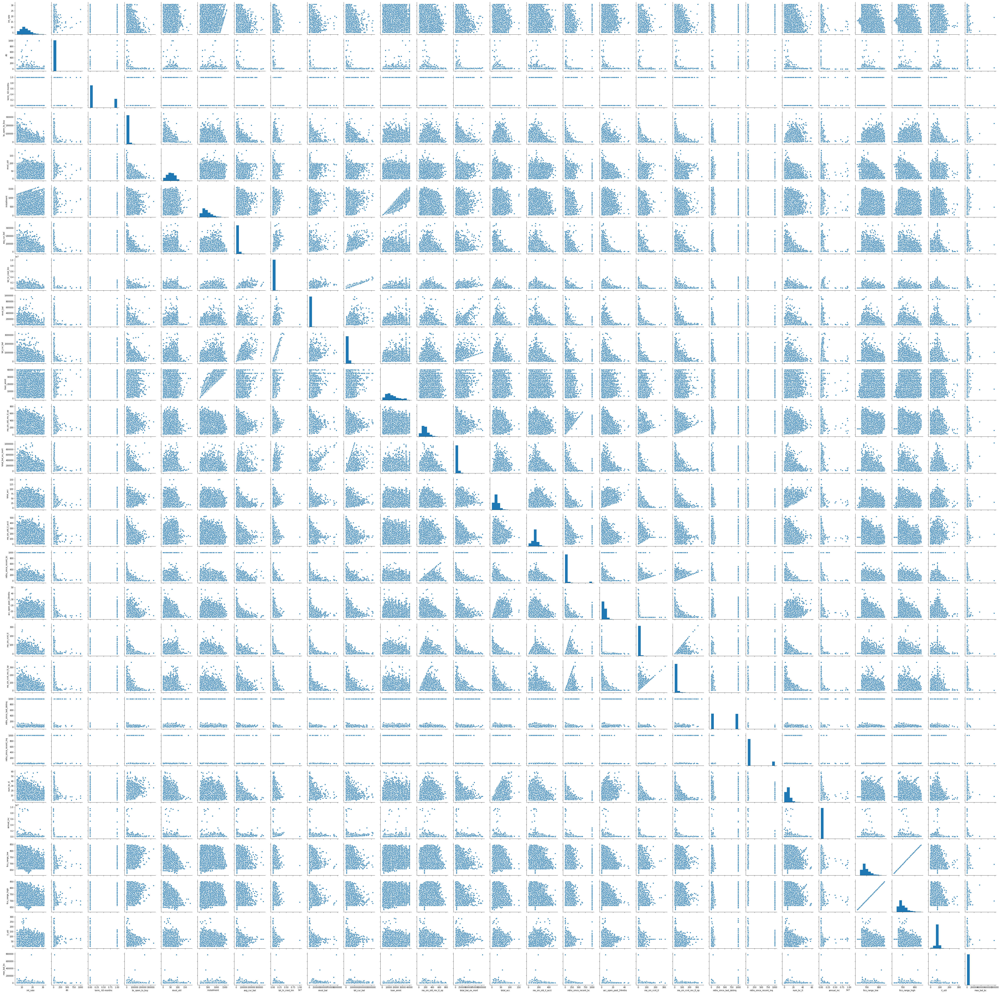

In [100]:
sns.pairplot(df_test)

### log transforms

In [109]:
df_test['dti_log'] = np.log(df_test['dti']+.001)
df_test['bc_open_to_buy_log'] = np.log(df_test['bc_open_to_buy']+.001)
df_test['avg_cur_bal_log'] = np.log(df_test['avg_cur_bal']+.001)
df_test['tot_hi_cred_lim_log'] = np.log(df_test['tot_hi_cred_lim']+.001)
df_test['revol_bal_log'] = np.log(df_test['revol_bal']+.001)
df_test['tot_cur_bal_log'] = np.log(df_test['tot_cur_bal']+.001)
df_test['total_bal_ex_mort_log'] = np.log(df_test['total_bal_ex_mort']+.001)
df_test['mths_since_recent_bc_log'] = np.log(df_test['mths_since_recent_bc']+.001)
df_test['mo_sin_rcnt_tl_log'] = np.log(df_test['mo_sin_rcnt_tl']+.001)
df_test['mo_sin_rcnt_rev_tl_op_log'] = np.log(df_test['mo_sin_rcnt_rev_tl_op']+.001)
df_test['mths_since_recent_inq_log'] = np.log(df_test['mths_since_recent_inq']+.001)
df_test['annual_inc_log'] = np.log(df_test['annual_inc']+.001)
df_test['max_bal_bc_log'] = np.log(df_test['max_bal_bc']+.001)

In [110]:
df_test.shape

(164680, 41)

In [111]:
#drop non log values
df_test.drop('dti', inplace=True, axis=1)
df_test.drop('bc_open_to_buy', inplace=True, axis=1)
df_test.drop('avg_cur_bal', inplace=True, axis=1)
df_test.drop('tot_hi_cred_lim', inplace=True, axis=1)
df_test.drop('revol_bal', inplace=True, axis=1)
df_test.drop('tot_cur_bal', inplace=True, axis=1)
df_test.drop('total_bal_ex_mort', inplace=True, axis=1)
df_test.drop('mths_since_recent_bc', inplace=True, axis=1)
df_test.drop('mo_sin_rcnt_tl', inplace=True, axis=1)
df_test.drop('mo_sin_rcnt_rev_tl_op', inplace=True, axis=1)
df_test.drop('mths_since_recent_inq', inplace=True, axis=1)
df_test.drop('annual_inc', inplace=True, axis=1)
df_test.drop('max_bal_bc', inplace=True, axis=1)

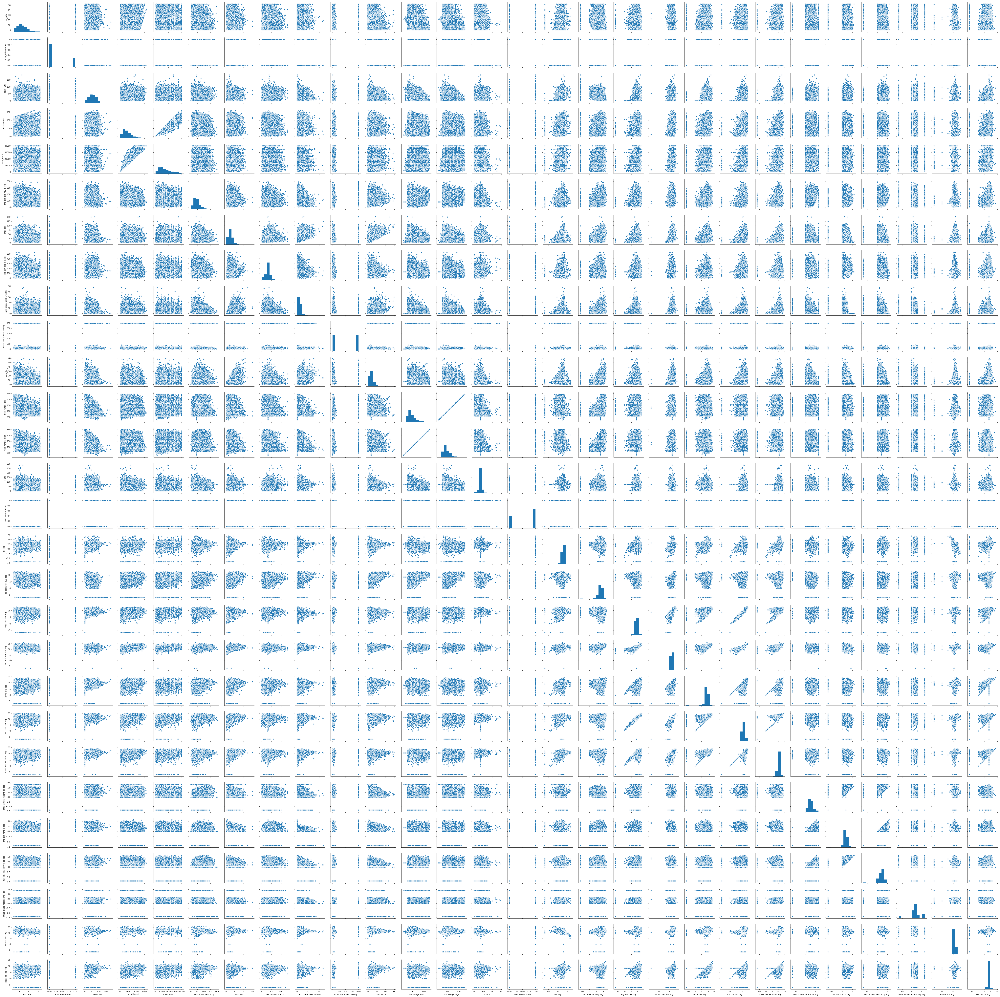

In [112]:
sns.pairplot(df_test)

In [165]:
list(df_test)

['int_rate',
 'term_ 60 months',
 'revol_util',
 'installment',
 'loan_amnt',
 'mo_sin_old_rev_tl_op',
 'total_acc',
 'mo_sin_old_il_acct',
 'acc_open_past_24mths',
 'mths_since_last_delinq',
 'num_bc_tl',
 'fico_range_low',
 'fico_range_high',
 'il_util',
 'loan_status_Late',
 'dti_log',
 'bc_open_to_buy_log',
 'avg_cur_bal_log',
 'tot_hi_cred_lim_log',
 'revol_bal_log',
 'tot_cur_bal_log',
 'total_bal_ex_mort_log',
 'mths_since_recent_bc_log',
 'mo_sin_rcnt_tl_log',
 'mo_sin_rcnt_rev_tl_op_log',
 'mths_since_recent_inq_log',
 'annual_inc_log',
 'max_bal_bc_log']

In [113]:
df_test.to_pickle('final_df.pkl')

In [ ]:
sns.stripplot(x='',y='location', jitter=True,data=train_df,alpha=0.6);

In [126]:
df_test = unpickle_("final_df.pkl")

In [127]:
df_test['term_ 60 months']=df_test['term_ 60 months'].astype(float)
df_test['loan_status_Late']=df_test['loan_status_Late'].astype(float)

In [128]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 164680 entries, 0 to 164679
Data columns (total 28 columns):
int_rate                     164680 non-null float64
term_ 60 months              164680 non-null float64
revol_util                   164680 non-null float64
installment                  164680 non-null float64
loan_amnt                    164680 non-null float64
mo_sin_old_rev_tl_op         164680 non-null float64
total_acc                    164680 non-null float64
mo_sin_old_il_acct           164680 non-null float64
acc_open_past_24mths         164680 non-null float64
mths_since_last_delinq       164680 non-null float64
num_bc_tl                    164680 non-null float64
fico_range_low               164680 non-null float64
fico_range_high              164680 non-null float64
il_util                      164680 non-null float64
loan_status_Late             164680 non-null float64
dti_log                      164680 non-null float64
bc_open_to_buy_log           164680 non-n

In [129]:
df_pie = df_test['loan_status_Late']

In [132]:
df_pie.mean()

0.6083009472917172

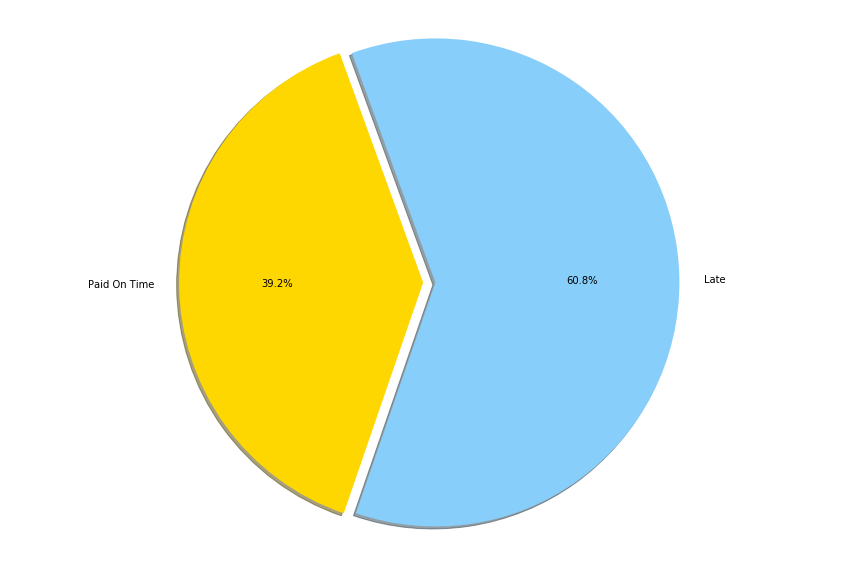

NameError: name 'pylab' is not defined

In [145]:
labels = 'Paid On Time', 'Late'
sizes = [1-0.6083009472917172, 0.6083009472917172]
colors = ['gold', 'lightskyblue']
explode = (0.1, 0)  # explode 1st slice

# Plot
plt.pie(sizes, explode=explode, labels=labels, colors=colors,
       autopct='%1.1f%%', shadow=True, startangle=110, radius =2)

plt.axis('equal')
plt.show()

In [10]:
df_test.drop('loan_status_Late', inplace=True, axis=1)

In [11]:
scaler = StandardScaler()
matrix_df = df_test.as_matrix()
matrix = scaler.fit_transform(matrix_df)
scaled_df = pd.DataFrame(matrix, columns=df_test.columns)

In [161]:
scaled_df.to_pickle('rf_df_28.pkl')

In [13]:
scaler = StandardScaler()
matrix_df = df_test.as_matrix()
scalar_object_27 = scaler.fit(matrix_df)
matrix = scalar_object_27.transform(matrix_df)
scaled_df_27 = pd.DataFrame(matrix, columns=df_test.columns)


In [14]:
pickle_(scalar_object_27, "scaler_27_features")

## Random Forest

In [99]:
ssX = StandardScaler()
y = df_test['loan_status_Late'].values
df_test.drop('loan_status_Late', inplace=True, axis=1)
X = df_test.values
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, test_size=0.25)
X_train_scaled = ssX.fit_transform(X_train)
X_test_scaled = ssX.transform(X_test)
# params = {'strategy': ["stratified", "most_frequent", "prior", "uniform", "constant"]}

In [90]:
rf = RandomForestClassifier() 
## Fit the model on your training data.
rf.fit(X_train_scaled, y_train) 
## And score it on your testing data.
rf.score(X_test_scaled, y_test)

0.7144765606023804

In [100]:
rf = RandomForestClassifier(n_estimators=100, criterion='entropy', min_samples_split=40, class_weight='balanced', random_state=0)

## Fit the model on your training data.
rf.fit(X_train_scaled, y_train) 
## And score it on your testing data.
rf.score(X_test_scaled, y_test)

0.7411707554044207

In [101]:
rfe = (rf.predict(X_test_scaled))

In [57]:
def differences(a, b):
    if len(a) != len(b):
        raise ValueError("Lists of different length.")
    return sum(i != j for i, j in zip(a, b))

In [59]:
differences(rfe,lre)

14591

In [60]:
14591/123510

0.11813618330499555

In [113]:
np.sum(abs((rfe-lre)))

14591.0

In [126]:
rf = RandomForestClassifier(n_estimators=101) 
## Fit the model on your training data.
rf.fit(X_train_scaled, y_train) 
## And score it on your testing data.
% timeit
rf.score(X_test_scaled, y_test)

0.744401263055623

In [11]:
rf.score(X_train_scaled, y_train)

1.0

In [42]:
rf.get_params()

{'bootstrap': True,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 10,
 'n_jobs': 1,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [44]:
tuned_parameters = [{"criterion":'entropy', "min_samples_split": 10, "class_weight": 'balanced'}, 
                    {"criterion":'entropy', "min_samples_split":9, "class_weight": 'balanced'}, 
                    {"criterion":'entropy', "min_samples_split":8, "class_weight": 'balanced'}, 
                    {"criterion":'entropy', "min_samples_split":7, "class_weight": 'balanced'}, 
                    {"criterion":'entropy', "min_samples_split":6, "class_weight": 'balanced'}, 
                    {"criterion":'entropy', "min_samples_split":5, "class_weight": 'balanced'}, 
                    {"criterion":'gini', "min_samples_split":10, "class_weight": 'balanced'}, 
                    {"criterion":'gini', "min_samples_split":9, "class_weight": 'balanced'}, 
                    {"criterion":'gini', "min_samples_split":8, "class_weight": 'balanced'}, 
                    {"criterion":'gini', "min_samples_split":7, "class_weight": 'balanced'}, 
                    {"criterion":'gini', "min_samples_split":6, "class_weight": 'balanced'}, 
                    {"criterion":'gini', "min_samples_split":5, "class_weight": 'balanced'}]

In [51]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)

In [63]:
'''def best_features(feature_importance_list):
    all_features = []
    
    for index, importance_val in enumerate(feature_importance_list):
        all_features.append((index,importance_val))

    all_features = sorted(all_features, key=lambda x: x[1], reverse=True)
    
    best_features = all_features[:28]
    
    for i in best_features:
        print(df.columns[i[0]])
        try:
            print(lookup_description(df.columns[i[0]]))
        except:
            print("DUMMY VARIABLE!")
        print()
        '''

In [20]:
#thanks to https://notmatthancock.github.io/2015/10/28/confusion-matrix.html

def show_confusion_matrix(C,class_labels=['Fully Paid','Late']):
    """
    C: ndarray, shape (2,2) as given by scikit-learn confusion_matrix function
    class_labels: list of strings, default simply labels 0 and 1.
    Draws confusion matrix with associated metrics.
    """
    import matplotlib.pyplot as plt
    import numpy as np
    
    assert C.shape == (2,2), "Confusion matrix should be from binary classification only."
    
    # true negative, false positive, etc...
    tn = C[0,0]; fp = C[0,1]; fn = C[1,0]; tp = C[1,1];

    NP = fn+tp # Num positive examples
    NN = tn+fp # Num negative examples
    N  = NP+NN

    fig = plt.figure(figsize=(8,8))
    ax  = fig.add_subplot(111)
    ax.imshow(C, interpolation='nearest', cmap=plt.cm.gray)

    # Draw the grid boxes
    ax.set_xlim(-0.5,2.5)
    ax.set_ylim(2.5,-0.5)
    ax.plot([-0.5,2.5],[0.5,0.5], '-k', lw=2)
    ax.plot([-0.5,2.5],[1.5,1.5], '-k', lw=2)
    ax.plot([0.5,0.5],[-0.5,2.5], '-k', lw=2)
    ax.plot([1.5,1.5],[-0.5,2.5], '-k', lw=2)

    # Set xlabels
    ax.set_xlabel('Predicted Label', fontsize=16)
    ax.set_xticks([0,1,2])
    ax.set_xticklabels(class_labels + [''])
    ax.xaxis.set_label_position('top')
    ax.xaxis.tick_top()
    # These coordinate might require some tinkering. Ditto for y, below.
    ax.xaxis.set_label_coords(0.34,1.06)

    # Set ylabels
    ax.set_ylabel('True Label', fontsize=16, rotation=90)
    ax.set_yticklabels(class_labels + [''],rotation=90)
    ax.set_yticks([0,1,2])
    ax.yaxis.set_label_coords(-0.09,0.65)


    # Fill in initial metrics: tp, tn, etc...
    ax.text(0,0,
            'True Neg: %d\n(Num Neg: %d)'%(tn,NN),
            va='center',
            ha='center',
            bbox=dict(fc='w',boxstyle='round,pad=1'))

    ax.text(0,1,
            'False Neg: %d'%fn,
            va='center',
            ha='center',
            bbox=dict(fc='w',boxstyle='round,pad=1'))

    ax.text(1,0,
            'False Pos: %d'%fp,
            va='center',
            ha='center',
            bbox=dict(fc='w',boxstyle='round,pad=1'))


    ax.text(1,1,
            'True Pos: %d\n(Num Pos: %d)'%(tp,NP),
            va='center',
            ha='center',
            bbox=dict(fc='w',boxstyle='round,pad=1'))

    # Fill in secondary metrics: accuracy, true pos rate, etc...
    ax.text(2,0,
            'False Pos Rate: %.2f'%(fp / (fp+tn+0.)),
            va='center',
            ha='center',
            bbox=dict(fc='w',boxstyle='round,pad=1'))

    ax.text(2,1,
            'True Pos Rate: %.2f'%(tp / (tp+fn+0.)),
            va='center',
            ha='center',
            bbox=dict(fc='w',boxstyle='round,pad=1'))

    ax.text(2,2,
            'Accuracy: %.2f'%((tp+tn+0.)/N),
            va='center',
            ha='center',
            bbox=dict(fc='w',boxstyle='round,pad=1'))

    ax.text(0,2,
            'Neg Pre Val: %.2f'%(1-fn/(fn+tn+0.)),
            va='center',
            ha='center',
            bbox=dict(fc='w',boxstyle='round,pad=1'))

    ax.text(1,2,
            'Pos Pred Val: %.2f'%(tp/(tp+fp+0.)),
            va='center',
            ha='center',
            bbox=dict(fc='w',boxstyle='round,pad=1'))


    plt.tight_layout()
    plt.show()

In [12]:
target_names = ["0", "1"]

### tested each model cv on train set test set as well as whole set just for the heck of it

{'criterion': 'entropy', 'min_samples_split': 10, 'class_weight': 'balanced'}


             precision    recall  f1-score   support

          0       0.67      0.64      0.66     16201
          1       0.77      0.80      0.79     24969

avg / total       0.73      0.74      0.73     41170


Accuracy Score:  0.7357541899441341

F1 score - Binary:  0.7856988082340194

F1 score - Micro:  0.735754189944134

F1 score - Weighted:  0.7344460601159238



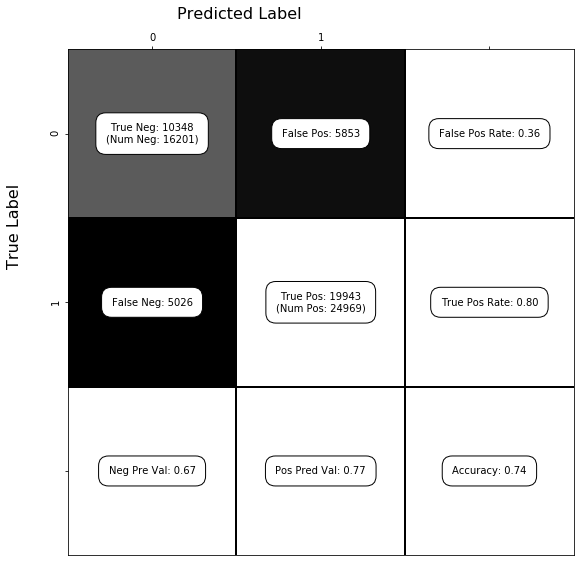

{'criterion': 'entropy', 'min_samples_split': 9, 'class_weight': 'balanced'}


             precision    recall  f1-score   support

          0       0.67      0.64      0.65     16201
          1       0.77      0.80      0.79     24969

avg / total       0.73      0.73      0.73     41170


Accuracy Score:  0.7345882924459558

F1 score - Binary:  0.7850327556018966

F1 score - Micro:  0.7345882924459559

F1 score - Weighted:  0.7331586404227798



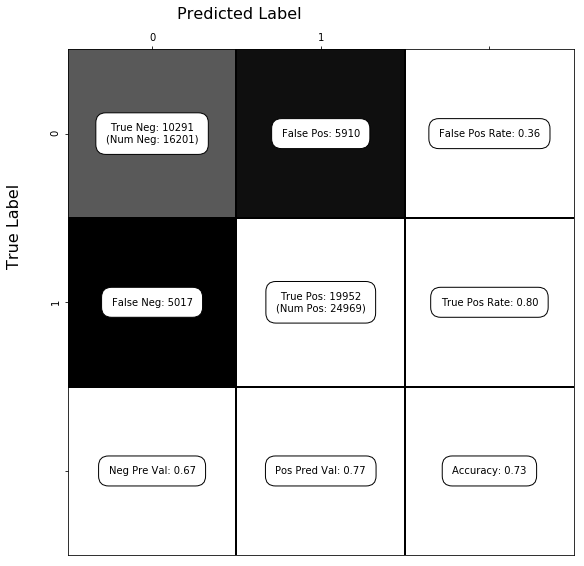

{'criterion': 'entropy', 'min_samples_split': 8, 'class_weight': 'balanced'}


             precision    recall  f1-score   support

          0       0.67      0.63      0.65     16201
          1       0.77      0.80      0.78     24969

avg / total       0.73      0.73      0.73     41170


Accuracy Score:  0.731649259169298

F1 score - Binary:  0.7825453686572452

F1 score - Micro:  0.731649259169298

F1 score - Weighted:  0.730248300742345



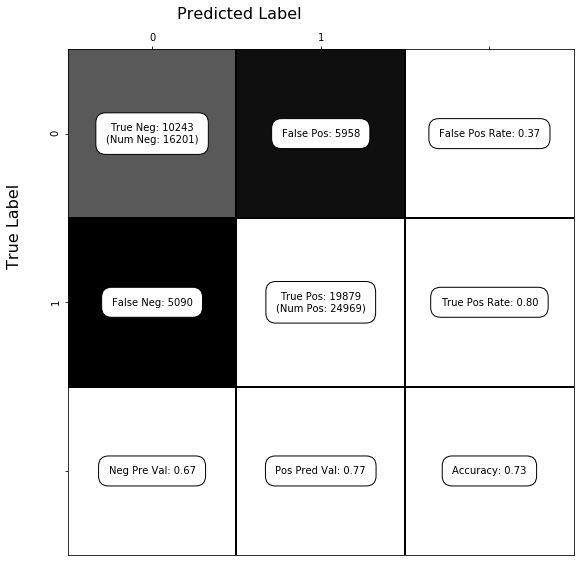

{'criterion': 'entropy', 'min_samples_split': 7, 'class_weight': 'balanced'}


             precision    recall  f1-score   support

          0       0.67      0.62      0.65     16201
          1       0.77      0.80      0.78     24969

avg / total       0.73      0.73      0.73     41170


Accuracy Score:  0.7318678649502065

F1 score - Binary:  0.7838583987625556

F1 score - Micro:  0.7318678649502066

F1 score - Weighted:  0.7299805954367573



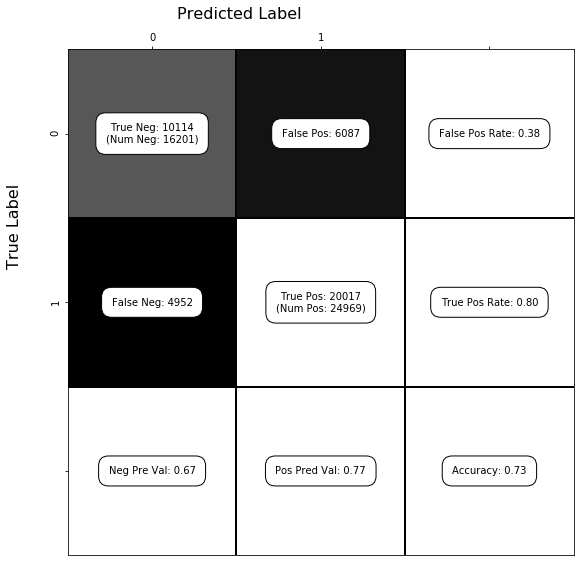

{'criterion': 'entropy', 'min_samples_split': 6, 'class_weight': 'balanced'}


             precision    recall  f1-score   support

          0       0.68      0.62      0.65     16201
          1       0.77      0.81      0.79     24969

avg / total       0.73      0.73      0.73     41170


Accuracy Score:  0.7338838960408064

F1 score - Binary:  0.7862243902439024

F1 score - Micro:  0.7338838960408064

F1 score - Weighted:  0.7316751238184048



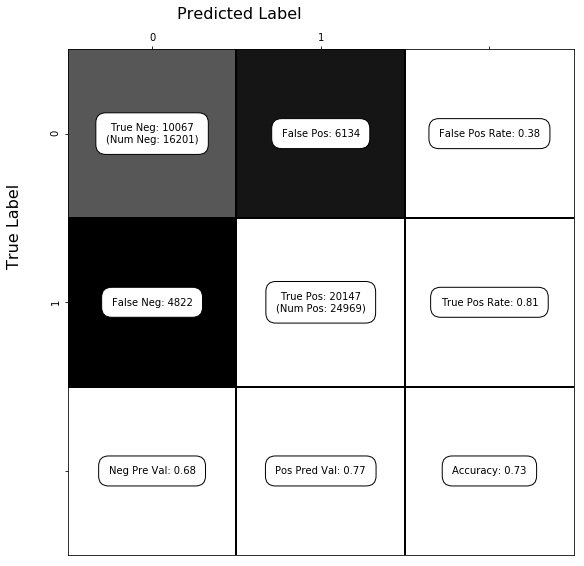

{'criterion': 'entropy', 'min_samples_split': 5, 'class_weight': 'balanced'}


             precision    recall  f1-score   support

          0       0.68      0.61      0.64     16201
          1       0.76      0.81      0.79     24969

avg / total       0.73      0.73      0.73     41170


Accuracy Score:  0.7324993927617197

F1 score - Binary:  0.7859516821830479

F1 score - Micro:  0.7324993927617197

F1 score - Weighted:  0.7298812013701411



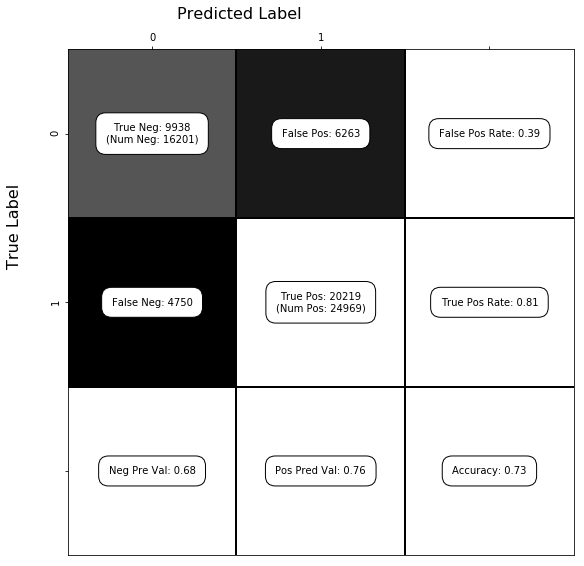

{'criterion': 'gini', 'min_samples_split': 10, 'class_weight': 'balanced'}


             precision    recall  f1-score   support

          0       0.67      0.63      0.65     16201
          1       0.77      0.80      0.78     24969

avg / total       0.73      0.73      0.73     41170


Accuracy Score:  0.730653388389604

F1 score - Binary:  0.7820686673348664

F1 score - Micro:  0.730653388389604

F1 score - Weighted:  0.7291088215649459



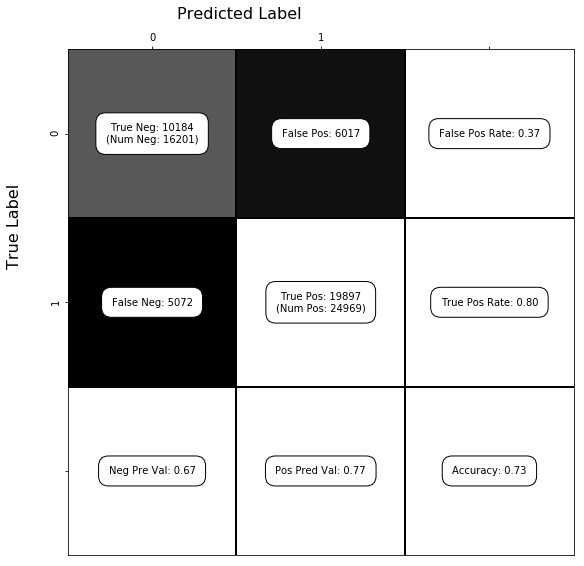

{'criterion': 'gini', 'min_samples_split': 9, 'class_weight': 'balanced'}


             precision    recall  f1-score   support

          0       0.68      0.63      0.65     16201
          1       0.77      0.80      0.79     24969

avg / total       0.73      0.74      0.73     41170


Accuracy Score:  0.735244109788681

F1 score - Binary:  0.7864085279824424

F1 score - Micro:  0.735244109788681

F1 score - Weighted:  0.7334562640781925



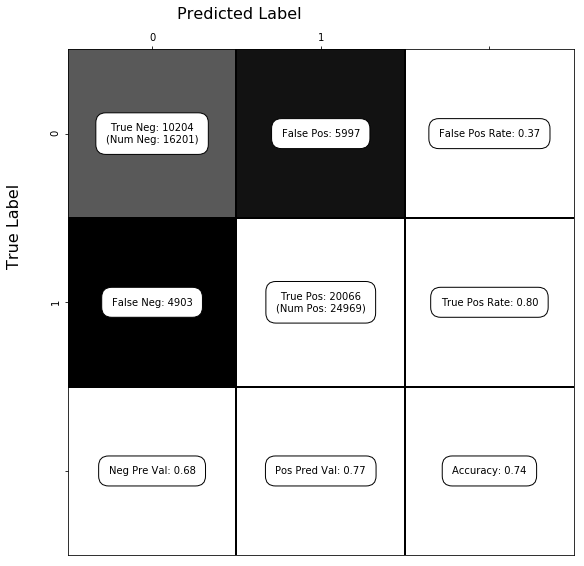

{'criterion': 'gini', 'min_samples_split': 8, 'class_weight': 'balanced'}


             precision    recall  f1-score   support

          0       0.67      0.62      0.65     16201
          1       0.77      0.80      0.78     24969

avg / total       0.73      0.73      0.73     41170


Accuracy Score:  0.7320621811999029

F1 score - Binary:  0.7842178361143171

F1 score - Micro:  0.7320621811999029

F1 score - Weighted:  0.7300858161733564



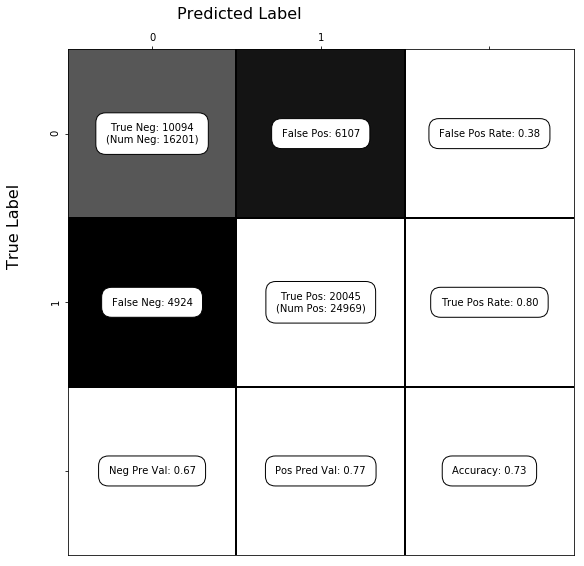

{'criterion': 'gini', 'min_samples_split': 7, 'class_weight': 'balanced'}


             precision    recall  f1-score   support

          0       0.68      0.61      0.64     16201
          1       0.76      0.81      0.79     24969

avg / total       0.73      0.73      0.73     41170


Accuracy Score:  0.7322564974495992

F1 score - Binary:  0.7855322295075587

F1 score - Micro:  0.7322564974495992

F1 score - Weighted:  0.7297444820318129



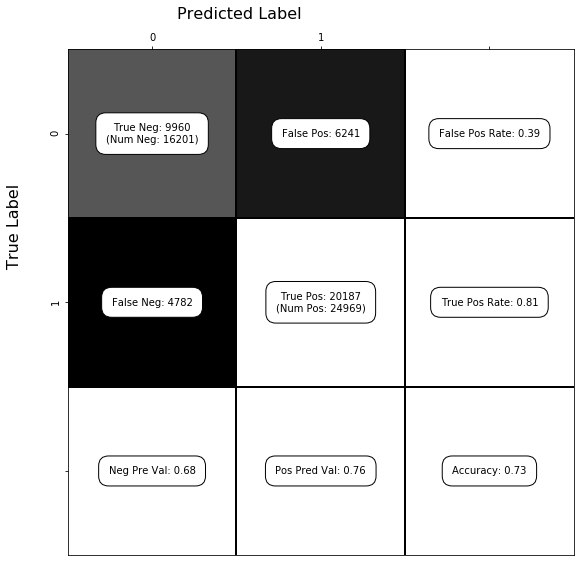

{'criterion': 'gini', 'min_samples_split': 6, 'class_weight': 'balanced'}


             precision    recall  f1-score   support

          0       0.67      0.61      0.64     16201
          1       0.76      0.81      0.78     24969

avg / total       0.73      0.73      0.73     41170


Accuracy Score:  0.7305076512023317

F1 score - Binary:  0.7847595398374299

F1 score - Micro:  0.7305076512023319

F1 score - Weighted:  0.7276728741811297



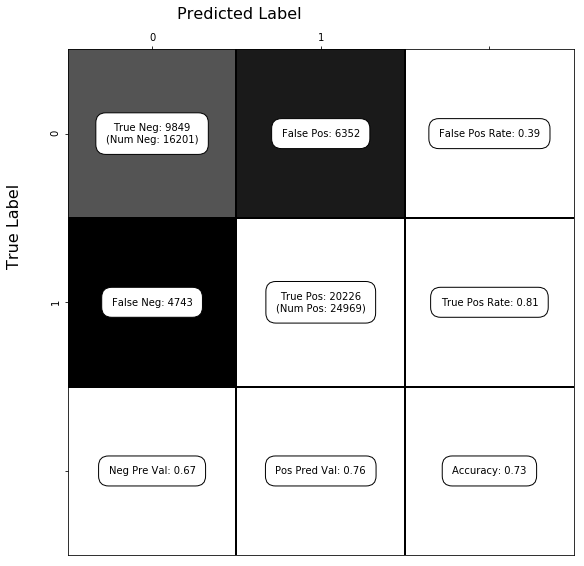

{'criterion': 'gini', 'min_samples_split': 5, 'class_weight': 'balanced'}


             precision    recall  f1-score   support

          0       0.68      0.60      0.64     16201
          1       0.76      0.81      0.79     24969

avg / total       0.73      0.73      0.73     41170


Accuracy Score:  0.7318192858877823

F1 score - Binary:  0.7864781759461602

F1 score - Micro:  0.7318192858877824

F1 score - Weighted:  0.7286590595062281



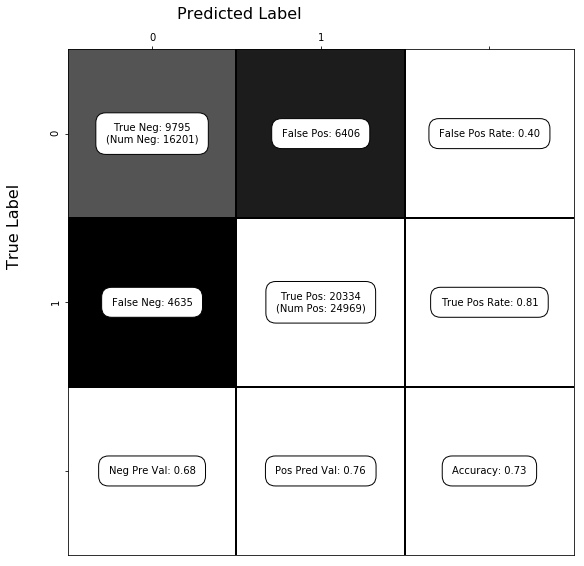

In [69]:
for param_dict in tuned_parameters:
    model = RandomForestClassifier(n_estimators=23, n_jobs=-1, criterion=param_dict['criterion'], min_samples_split=param_dict["min_samples_split"], class_weight=param_dict["class_weight"], random_state=0)
    print(param_dict)
    print()
    y_pred = cross_val_predict(model, X_train_scaled, y_train, cv=cv, n_jobs=-1)
    print()
    print(classification_report(y_train, y_pred,target_names=target_names))
    print()
    cnf_matrix = confusion_matrix(y_train, y_pred)
    print("Accuracy Score: ", np.median(accuracy_score(y_train, y_pred)))
    print()
    print("F1 score - Binary: ", np.median(f1_score(y_train, y_pred, average='binary')))
    print()
    print("F1 score - Micro: ", np.median(f1_score(y_train, y_pred, average='micro')))
    print()
    print("F1 score - Weighted: ", np.median(f1_score(y_train, y_pred, average='weighted')))
    print()
    print("Log_loss: ", metrics.log_loss(y_train, y_pred))
    print()
    show_confusion_matrix(cnf_matrix, class_labels=target_names)

In [47]:
'''# Set the parameters by cross-validation
scores = ['precision', 'recall']

for score in scores:
    print("# Tuning hyper-parameters for {}s".format(score))
    print()

    clf = GridSearchCV(rf, tuned_parameters, cv=5,
                       scoring='{}_macro'.format(score))
    clf.fit(X_train_scaled, y_train)

    print("Best parameters set found on development set:")
    print()
    print(clf.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = clf.cv_results_['mean_test_score']
    stds = clf.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, clf.cv_results_['params']):
        print("{}0.3f (+/-{}0.03f) for {}r"
              .format(mean, std * 2, params))
    print()

    print("Detailed classification report:")
    print()
    print("The model is trained on the full development set.")
    print("The scores are computed on the full evaluation set.")
    print()
    print(classification_report(y_test, clf.predict(X_test_scaled)))
    print()

# Note the problem is too easy: the hyperparameter plateau is too flat and the
# output model is the same for precision and recall with ties in quality.
''';

## Some of these say test set(for all models), because I ran on the test, the train and the whole model just for the heck of it, but everything I used for the analysis was using the test set.

             precision    recall  f1-score   support

          0       0.66      0.69      0.68     16201
          1       0.79      0.77      0.78     24969

avg / total       0.74      0.74      0.74     41170


Accuracy Score:  0.7395190672820015

F1 score - Binary:  0.7820236594983535

F1 score - Micro:  0.7395190672820015

F1 score - Weighted:  0.7404681167732844



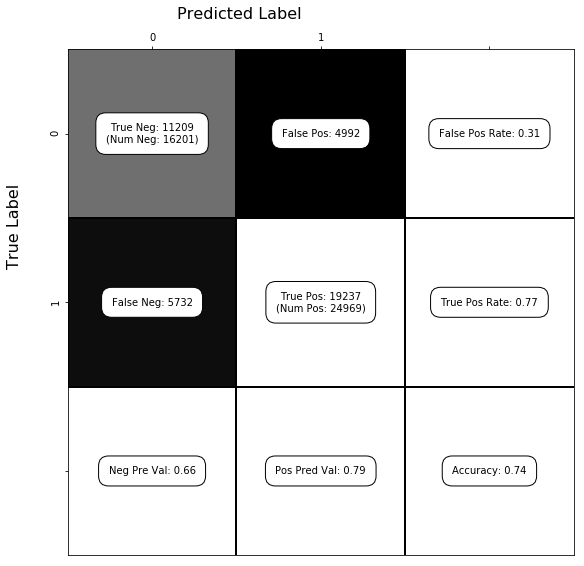

In [14]:
final_cv = StratifiedKFold(n_splits=11, shuffle=True, random_state=0)

final_model = RandomForestClassifier(n_estimators=100, n_jobs=-1, criterion='entropy', min_samples_split=40, class_weight='balanced', random_state=0)

y_pred = cross_val_predict(final_model, X_test_scaled, y_test, cv=final_cv, n_jobs=-1)

print(classification_report(y_test, y_pred,target_names=target_names))

print()

cnf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy Score: ", np.median(accuracy_score(y_test, y_pred)))

print()

print("F1 score - Binary: ", np.median(f1_score(y_test, y_pred, average='binary')))
print()
print("F1 score - Micro: ", np.median(f1_score(y_test, y_pred, average='micro')))
print()
print("F1 score - Weighted: ", np.median(f1_score(y_test, y_pred, average='weighted')))
print()
print("Log_loss: ", metrics.log_loss(y_test, y_pred))
print()
show_confusion_matrix(cnf_matrix, class_labels=target_names)

In [16]:
fit_object = final_model.fit(X_test_scaled, y_test)
print()

proba = cross_val_predict(final_model, X_test_scaled, y_test, cv=final_cv, method='predict_proba')

In [152]:
from sklearn.externals import joblib
fit_object
joblib.dump(fit_object, 'rf_final_model.pkl')

['rf_final_model.pkl']

             precision    recall  f1-score   support

          0       0.66      0.70      0.68     48304
          1       0.80      0.77      0.78     75206

avg / total       0.74      0.74      0.74    123510


Accuracy Score:  0.7417051250910858

F1 score - Binary:  0.7843935011218945

F1 score - Micro:  0.7417051250910859

F1 score - Weighted:  0.7427600954565702

Log_loss:  8.92128427027605



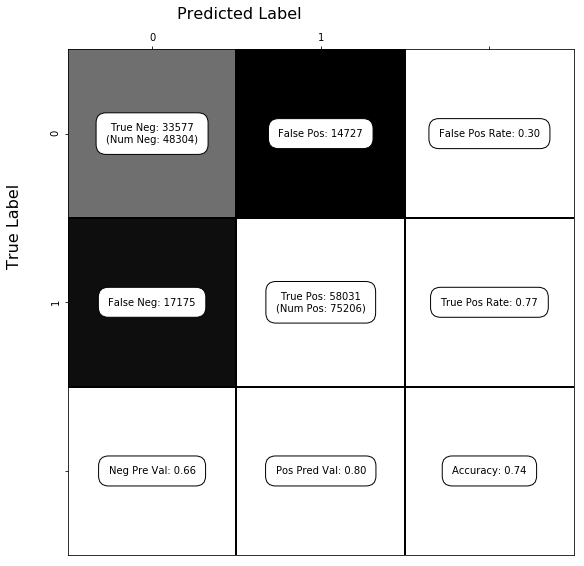

In [148]:
final_cv = StratifiedKFold(n_splits=11, shuffle=True, random_state=0)

final_model = RandomForestClassifier(n_estimators=101, n_jobs=-1, criterion='entropy', min_samples_split=40, class_weight='balanced', random_state=0)

y_pred = cross_val_predict(final_model, X_train_scaled, y_train, cv=final_cv, n_jobs=-1)

print(classification_report(y_train, y_pred,target_names=target_names))

print()

cnf_matrix = confusion_matrix(y_train, y_pred)

print("Accuracy Score: ", np.median(accuracy_score(y_train, y_pred)))

print()

print("F1 score - Binary: ", np.median(f1_score(y_train, y_pred, average='binary')))
print()
print("F1 score - Micro: ", np.median(f1_score(y_train, y_pred, average='micro')))
print()
print("F1 score - Weighted: ", np.median(f1_score(y_train, y_pred, average='weighted')))
print()
print("Log_loss: ", metrics.log_loss(y_train, y_pred))
print()
show_confusion_matrix(cnf_matrix, class_labels=target_names)

In [17]:
fit_object

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='entropy', max_depth=None, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=40, min_weight_fraction_leaf=0.0,
            n_estimators=100, n_jobs=-1, oob_score=False, random_state=0,
            verbose=0, warm_start=False)

In [18]:
rf_mod

array([[0.26951632, 0.73048368],
       [0.36184099, 0.63815901],
       [0.82527977, 0.17472023],
       ...,
       [0.23781381, 0.76218619],
       [0.21932485, 0.78067515],
       [0.67497841, 0.32502159]])

In [20]:
probs_of_0 = proba[:,0]

In [21]:
f1 = -1
final = [(0,0)]
for prob in np.arange(0.1,1, 0.01):
    test = []
    for i in probs_of_0:
        if i > prob:
            test.append(0)
        else:
            test.append(1)
    val = f1_score(y_test, test)


    if val > f1:
        f1 = val
        final.pop(0)
        final.append((prob, f1))
final

[(0.6499999999999997, 0.8008274448065025)]

#### The above shows us that we can maxiize our f1-score if we adjust the threshold to be ~0.68. That is to say, if our model predicts a probability of 0.68 or higher, then you will be classified as paying off your loan on time.

## Log Reg w final 28 test

In [103]:
lr = LogisticRegression()
lr.fit(X_train_scaled, y_train) 
## And score it on your testing data.
lr.score(X_test_scaled, y_test)

0.6391304347826087

In [104]:
lre = (lr.predict(X_test_scaled))

In [107]:
lre

array([1., 1., 1., ..., 0., 0., 1.])

In [91]:
LogisticRegression().get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'max_iter': 100,
 'multi_class': 'ovr',
 'n_jobs': 1,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'liblinear',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [90]:
tuned_parameters = [{"C":0.0001, "class_weight": 'balanced', 'penalty':'l2'},
                    {"C":0.001, "class_weight": 'balanced', 'penalty':'l2'},
                    {"C":0.01, "class_weight": 'balanced', 'penalty':'l2'},
                    {"C":0.1, "class_weight": 'balanced', 'penalty':'l2'},
                    {"C":1, "class_weight": 'balanced', 'penalty':'l2'},
                    {"C":10, "class_weight": 'balanced', 'penalty':'l2'},
                    {"C":100, "class_weight": 'balanced', 'penalty':'l2'},
                    {"C":1000, "class_weight": 'balanced', 'penalty':'l2'},
                    {"C":0.0001, "class_weight": 'balanced', 'penalty':'l1'},
                    {"C":0.001, "class_weight": 'balanced', 'penalty':'l1'},
                    {"C":0.01, "class_weight": 'balanced', 'penalty':'l1'},
                    {"C":0.1, "class_weight": 'balanced', 'penalty':'l1'},
                    {"C":1, "class_weight": 'balanced', 'penalty':'l1'},
                    {"C":10, "class_weight": 'balanced', 'penalty':'l1'},
                    {"C":100, "class_weight": 'balanced', 'penalty':'l1'},
                    {"C":1000, "class_weight": 'balanced', 'penalty':'l1'}]

In [92]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)

{'C': 0.0001, 'class_weight': 'balanced', 'penalty': 'l2'}


             precision    recall  f1-score   support

          0       0.57      0.24      0.34     16201
          1       0.64      0.88      0.74     24969

avg / total       0.61      0.63      0.58     41170


Accuracy Score:  0.6298518338596065

F1 score - Binary:  0.7431614784352721

F1 score - Micro:  0.6298518338596065

F1 score - Weighted:  0.5835813896127087

Log_loss:  12.784703962195566



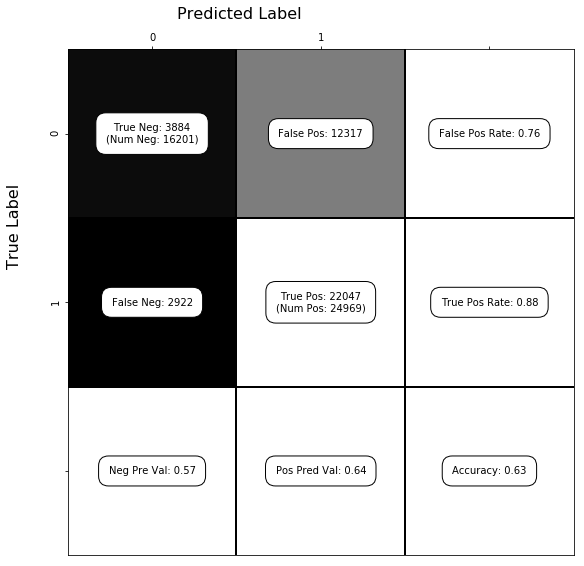

{'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}


             precision    recall  f1-score   support

          0       0.58      0.26      0.36     16201
          1       0.65      0.88      0.75     24969

avg / total       0.62      0.64      0.59     41170


Accuracy Score:  0.635729900412922

F1 score - Binary:  0.7457920162725654

F1 score - Micro:  0.635729900412922

F1 score - Weighted:  0.5930298540072338

Log_loss:  12.581677103540647



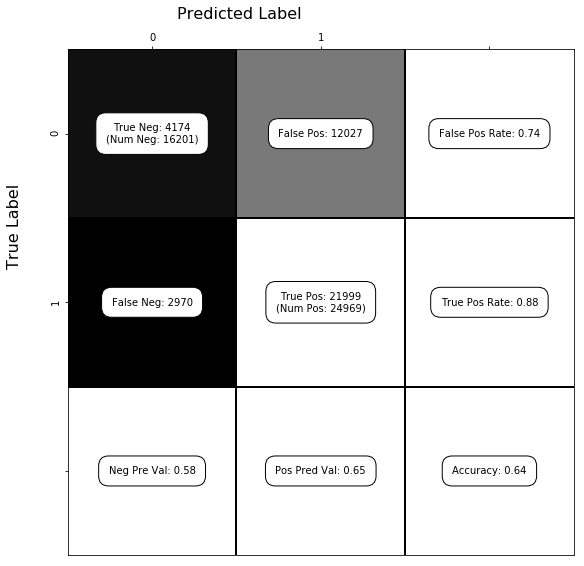

{'C': 0.01, 'class_weight': 'balanced', 'penalty': 'l2'}


             precision    recall  f1-score   support

          0       0.58      0.28      0.38     16201
          1       0.65      0.87      0.74     24969

avg / total       0.62      0.64      0.60     41170


Accuracy Score:  0.6381102744717027

F1 score - Binary:  0.7448670308406254

F1 score - Micro:  0.6381102744717027

F1 score - Weighted:  0.6003933884455274

Log_loss:  12.49945513738551



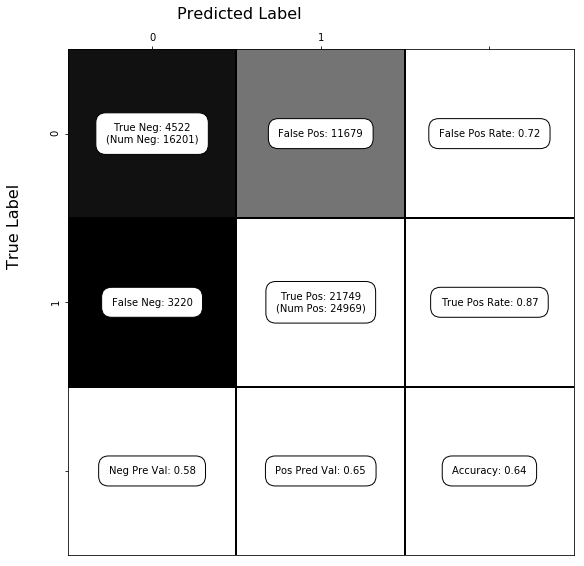

{'C': 0.1, 'class_weight': 'balanced', 'penalty': 'l2'}


             precision    recall  f1-score   support

          0       0.58      0.28      0.38     16201
          1       0.65      0.87      0.74     24969

avg / total       0.62      0.64      0.60     41170


Accuracy Score:  0.6380616954092786

F1 score - Binary:  0.7442195787630671

F1 score - Micro:  0.6380616954092786

F1 score - Weighted:  0.601391536723892

Log_loss:  12.501131658652627



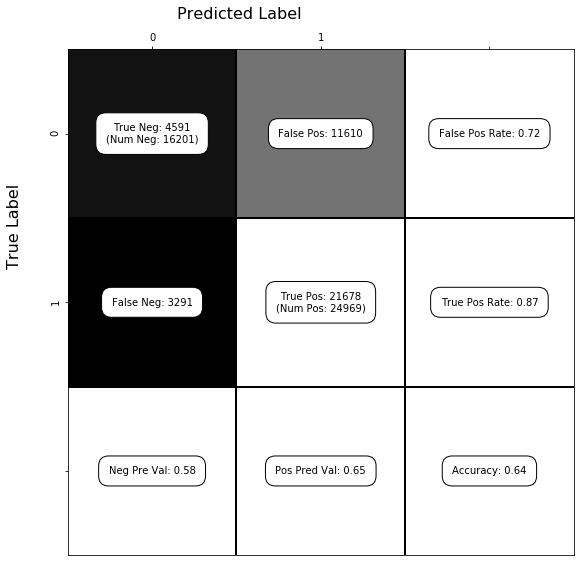

{'C': 1, 'class_weight': 'balanced', 'penalty': 'l2'}


             precision    recall  f1-score   support

          0       0.58      0.28      0.38     16201
          1       0.65      0.87      0.74     24969

avg / total       0.62      0.64      0.60     41170


Accuracy Score:  0.6381345640029148

F1 score - Binary:  0.7442139962914635

F1 score - Micro:  0.6381345640029148

F1 score - Weighted:  0.6015685047155357

Log_loss:  12.498614711216042



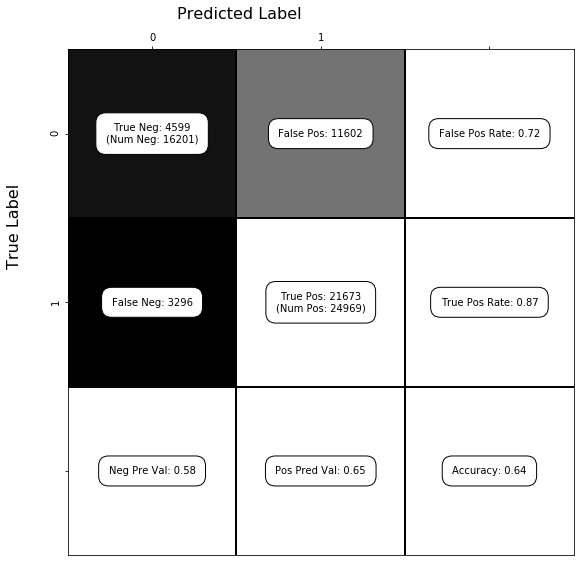

{'C': 10, 'class_weight': 'balanced', 'penalty': 'l2'}


             precision    recall  f1-score   support

          0       0.58      0.28      0.38     16201
          1       0.65      0.87      0.74     24969

avg / total       0.62      0.64      0.60     41170


Accuracy Score:  0.6380859849404906

F1 score - Binary:  0.7441796579905227

F1 score - Micro:  0.6380859849404906

F1 score - Weighted:  0.6015150167983274

Log_loss:  12.500292592012428



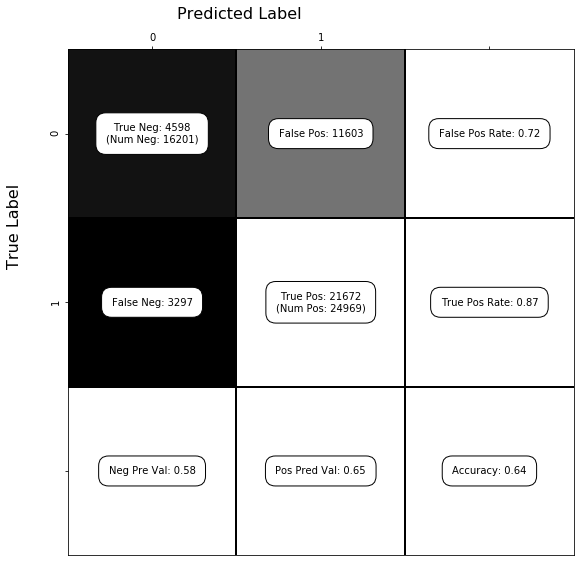

{'C': 100, 'class_weight': 'balanced', 'penalty': 'l2'}


             precision    recall  f1-score   support

          0       0.58      0.28      0.38     16201
          1       0.65      0.87      0.74     24969

avg / total       0.62      0.64      0.60     41170


Accuracy Score:  0.6380616954092786

F1 score - Binary:  0.744166881277363

F1 score - Micro:  0.6380616954092786

F1 score - Weighted:  0.6014808371811743

Log_loss:  12.501131542121545



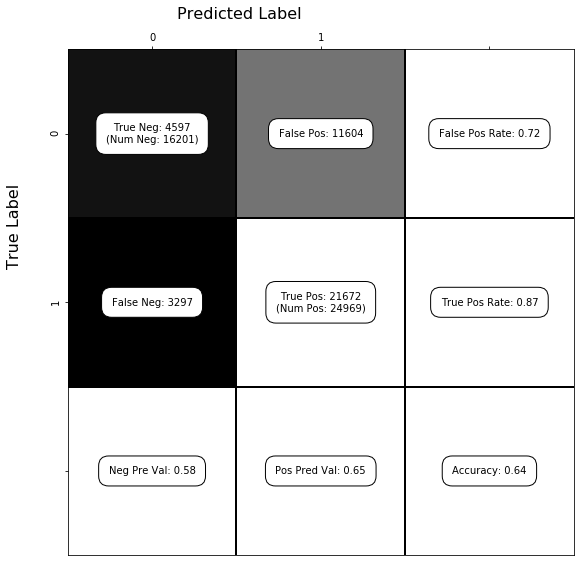

{'C': 1000, 'class_weight': 'balanced', 'penalty': 'l2'}


             precision    recall  f1-score   support

          0       0.58      0.28      0.38     16201
          1       0.65      0.87      0.74     24969

avg / total       0.62      0.64      0.60     41170


Accuracy Score:  0.6380616954092786

F1 score - Binary:  0.744166881277363

F1 score - Micro:  0.6380616954092786

F1 score - Weighted:  0.6014808371811743

Log_loss:  12.501131542121545



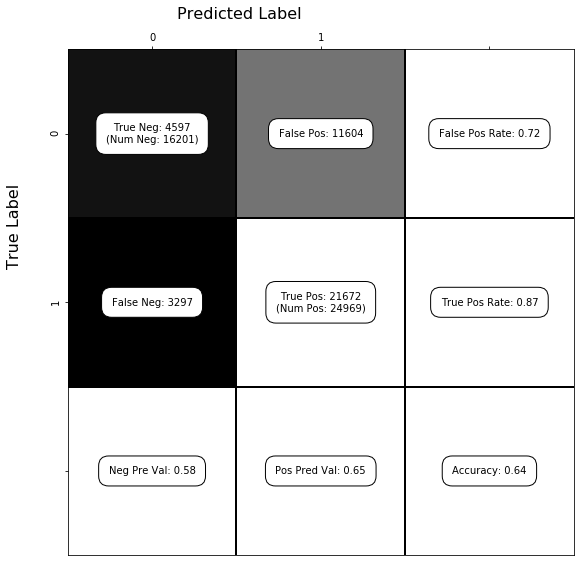

{'C': 0.0001, 'class_weight': 'balanced', 'penalty': 'l1'}


             precision    recall  f1-score   support

          0       0.57      0.24      0.34     16201
          1       0.64      0.88      0.74     24969

avg / total       0.61      0.63      0.58     41170


Accuracy Score:  0.6298518338596065

F1 score - Binary:  0.7431614784352721

F1 score - Micro:  0.6298518338596065

F1 score - Weighted:  0.5835813896127087

Log_loss:  12.784703962195566



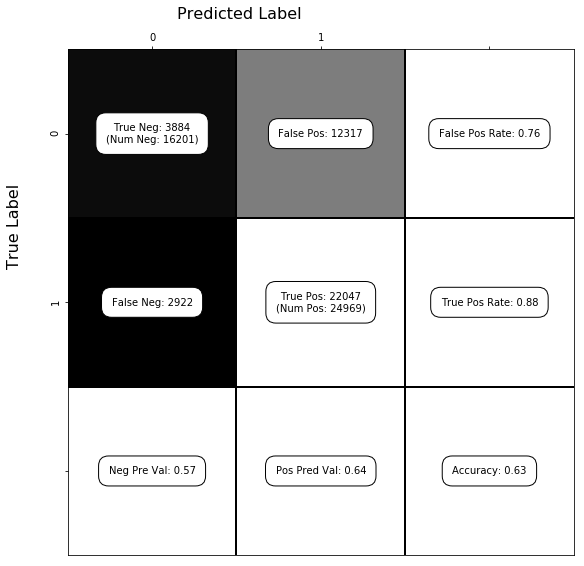

{'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l1'}


             precision    recall  f1-score   support

          0       0.58      0.26      0.36     16201
          1       0.65      0.88      0.75     24969

avg / total       0.62      0.64      0.59     41170


Accuracy Score:  0.635729900412922

F1 score - Binary:  0.7457920162725654

F1 score - Micro:  0.635729900412922

F1 score - Weighted:  0.5930298540072338

Log_loss:  12.581677103540647



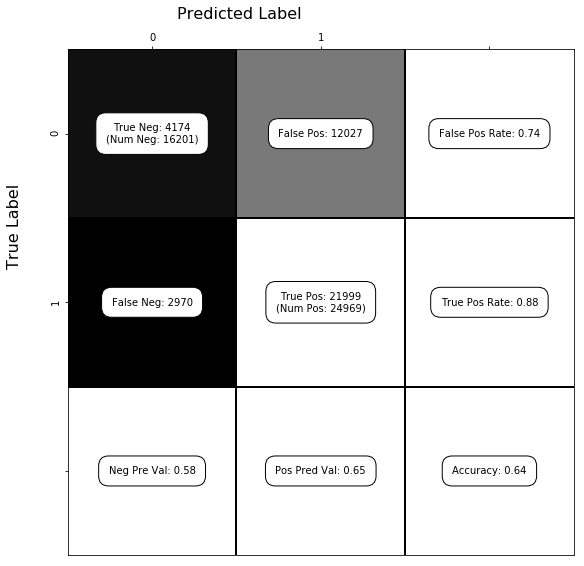

{'C': 0.01, 'class_weight': 'balanced', 'penalty': 'l1'}


             precision    recall  f1-score   support

          0       0.58      0.28      0.38     16201
          1       0.65      0.87      0.74     24969

avg / total       0.62      0.64      0.60     41170


Accuracy Score:  0.6381102744717027

F1 score - Binary:  0.7448670308406254

F1 score - Micro:  0.6381102744717027

F1 score - Weighted:  0.6003933884455274

Log_loss:  12.49945513738551



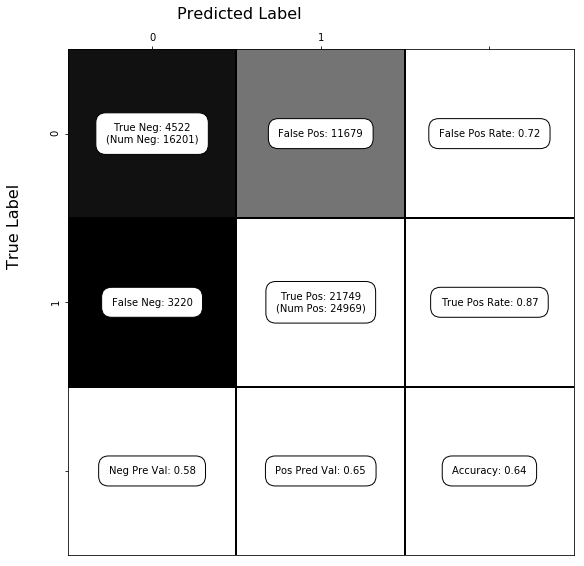

{'C': 0.1, 'class_weight': 'balanced', 'penalty': 'l1'}


             precision    recall  f1-score   support

          0       0.58      0.28      0.38     16201
          1       0.65      0.87      0.74     24969

avg / total       0.62      0.64      0.60     41170


Accuracy Score:  0.6380616954092786

F1 score - Binary:  0.7442195787630671

F1 score - Micro:  0.6380616954092786

F1 score - Weighted:  0.601391536723892

Log_loss:  12.501131658652627



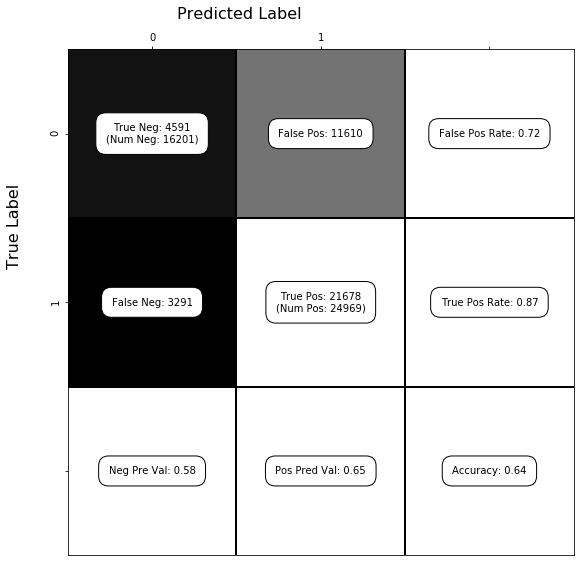

{'C': 1, 'class_weight': 'balanced', 'penalty': 'l1'}


             precision    recall  f1-score   support

          0       0.58      0.28      0.38     16201
          1       0.65      0.87      0.74     24969

avg / total       0.62      0.64      0.60     41170


Accuracy Score:  0.6381345640029148

F1 score - Binary:  0.7442139962914635

F1 score - Micro:  0.6381345640029148

F1 score - Weighted:  0.6015685047155357

Log_loss:  12.498614711216042



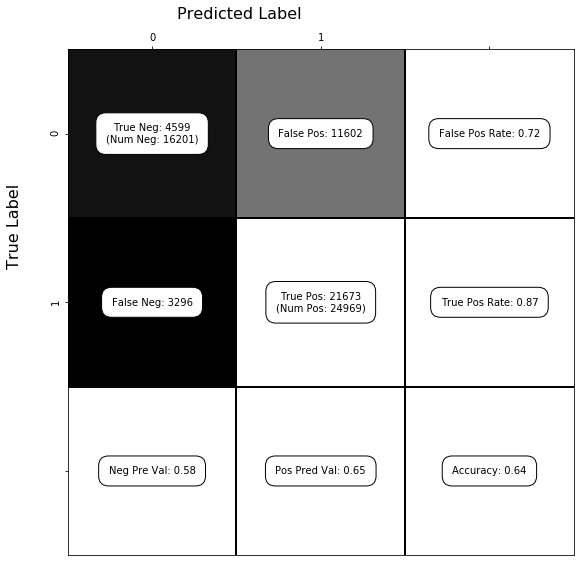

{'C': 10, 'class_weight': 'balanced', 'penalty': 'l1'}


             precision    recall  f1-score   support

          0       0.58      0.28      0.38     16201
          1       0.65      0.87      0.74     24969

avg / total       0.62      0.64      0.60     41170


Accuracy Score:  0.6380859849404906

F1 score - Binary:  0.7441796579905227

F1 score - Micro:  0.6380859849404906

F1 score - Weighted:  0.6015150167983274

Log_loss:  12.500292592012428



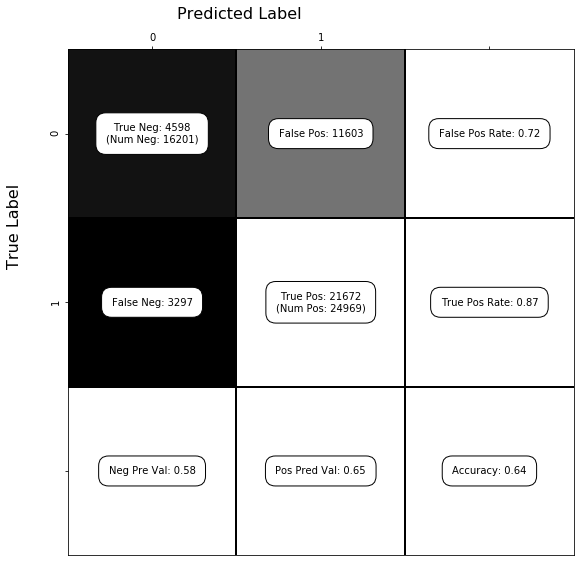

{'C': 100, 'class_weight': 'balanced', 'penalty': 'l1'}


             precision    recall  f1-score   support

          0       0.58      0.28      0.38     16201
          1       0.65      0.87      0.74     24969

avg / total       0.62      0.64      0.60     41170


Accuracy Score:  0.6380616954092786

F1 score - Binary:  0.744166881277363

F1 score - Micro:  0.6380616954092786

F1 score - Weighted:  0.6014808371811743

Log_loss:  12.501131542121545



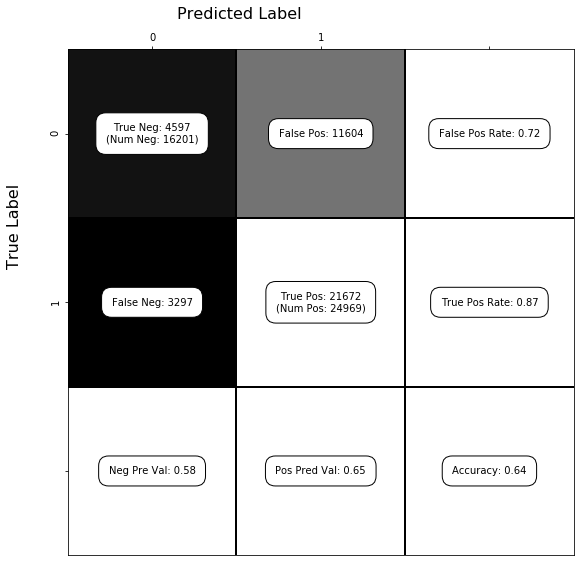

{'C': 1000, 'class_weight': 'balanced', 'penalty': 'l1'}


             precision    recall  f1-score   support

          0       0.58      0.28      0.38     16201
          1       0.65      0.87      0.74     24969

avg / total       0.62      0.64      0.60     41170


Accuracy Score:  0.6380616954092786

F1 score - Binary:  0.744166881277363

F1 score - Micro:  0.6380616954092786

F1 score - Weighted:  0.6014808371811743

Log_loss:  12.501131542121545



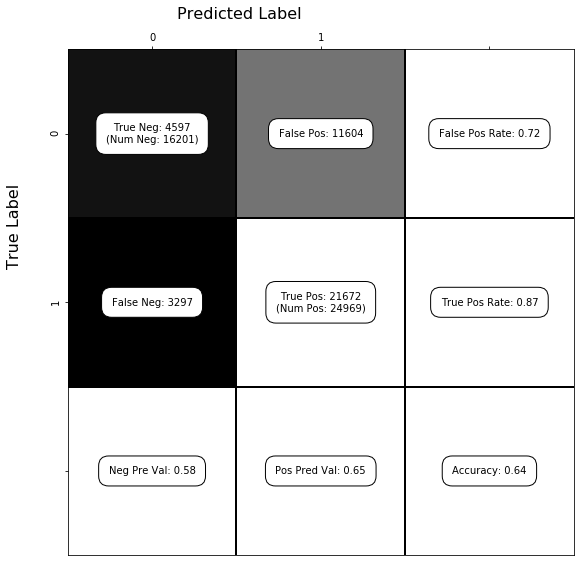

In [119]:
for param_dict in tuned_parameters:
    model = LogisticRegression(C=param_dict['C'])
    print(param_dict)
    print()
    y_pred = cross_val_predict(model, X_train_scaled, y_train, cv=cv, n_jobs=-1)
    print()
    print(classification_report(y_train, y_pred,target_names=target_names))
    print()
    cnf_matrix = confusion_matrix(y_train, y_pred)
    print("Accuracy Score: ", np.median(accuracy_score(y_train, y_pred)))
    print()
    print("F1 score - Binary: ", np.median(f1_score(y_train, y_pred, average='binary')))
    print()
    print("F1 score - Micro: ", np.median(f1_score(y_train, y_pred, average='micro')))
    print()
    print("F1 score - Weighted: ", np.median(f1_score(y_train, y_pred, average='weighted')))
    print()
    print("Log_loss: ", metrics.log_loss(y_train, y_pred))
    print()
    show_confusion_matrix(cnf_matrix, class_labels=target_names)

## Naive Bayes Classifier 28

In [125]:
gnb = GaussianNB()
gnb.fit(X_train_scaled,y_train)
gnb.score(X_test_scaled,y_test)

0.6349040563517124

In [124]:
bnb = BernoulliNB()
bnb.fit(X_train_scaled,y_train)
bnb.score(X_test_scaled,y_test)

0.6624240952149624

In [120]:
tuned_parameters = [{"priors":[0.0, 1.0]},
                    {"priors":[0.1, 0.9]},
                    {"priors":[0.2, 0.8]},
                    {"priors":[0.3, 0.7]},
                    {"priors":[0.4, 0.6]},
                    {"priors":[0.5, 0.5]},
                    {"priors":[0.6, 0.4]},
                    {"priors":[0.7, 0.3]},
                    {"priors":[0.8, 0.2]},
                    {"priors":[0.9, 0.1]}]

In [118]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)

{'priors': [0.0, 1.0]}


             precision    recall  f1-score   support

          0       0.00      0.00      0.00     16201
          1       0.61      1.00      0.76     24969

avg / total       0.37      0.61      0.46     41170


Accuracy Score:  0.6064853048336167

F1 score - Binary:  0.7550461905985878

F1 score - Micro:  0.6064853048336167

F1 score - Weighted:  0.45792441906864556

Log_loss:  13.591830717802154



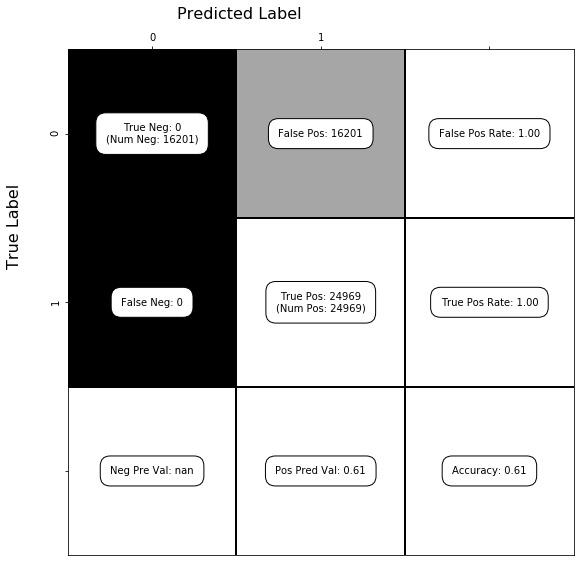

{'priors': [0.1, 0.9]}


             precision    recall  f1-score   support

          0       0.69      0.14      0.23     16201
          1       0.63      0.96      0.76     24969

avg / total       0.66      0.64      0.55     41170


Accuracy Score:  0.6369443769735245

F1 score - Binary:  0.7623650614477179

F1 score - Micro:  0.6369443769735245

F1 score - Weighted:  0.5533284368742487

Log_loss:  12.539767995075806



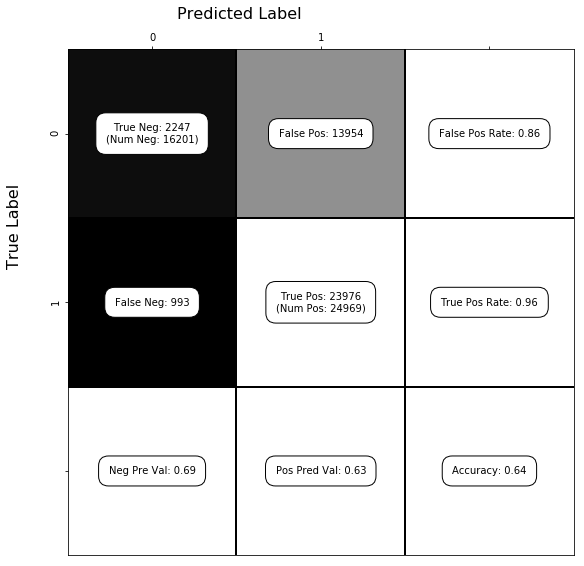

{'priors': [0.2, 0.8]}


             precision    recall  f1-score   support

          0       0.63      0.36      0.45     16201
          1       0.67      0.86      0.76     24969

avg / total       0.66      0.66      0.64     41170


Accuracy Score:  0.6640514938061696

F1 score - Binary:  0.7573125581232124

F1 score - Micro:  0.6640514938061696

F1 score - Weighted:  0.6381029243703692

Log_loss:  11.603453138556612



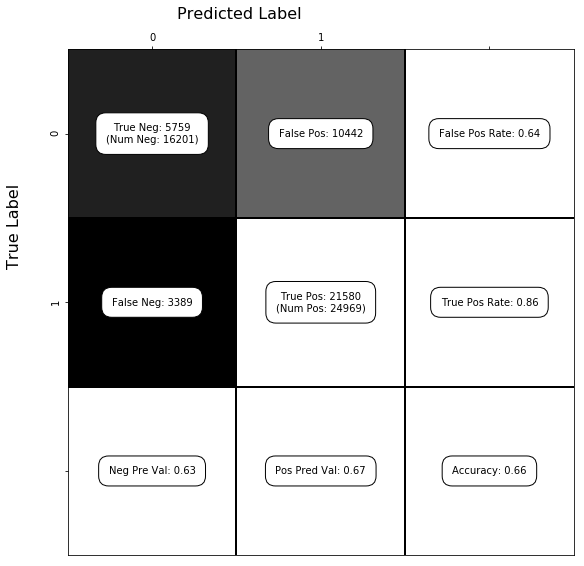

{'priors': [0.3, 0.7]}


             precision    recall  f1-score   support

          0       0.57      0.59      0.58     16201
          1       0.73      0.72      0.72     24969

avg / total       0.67      0.67      0.67     41170


Accuracy Score:  0.6661161039591936

F1 score - Binary:  0.7227287397127641

F1 score - Micro:  0.6661161039591936

F1 score - Weighted:  0.6667416006672509

Log_loss:  11.532071198213385



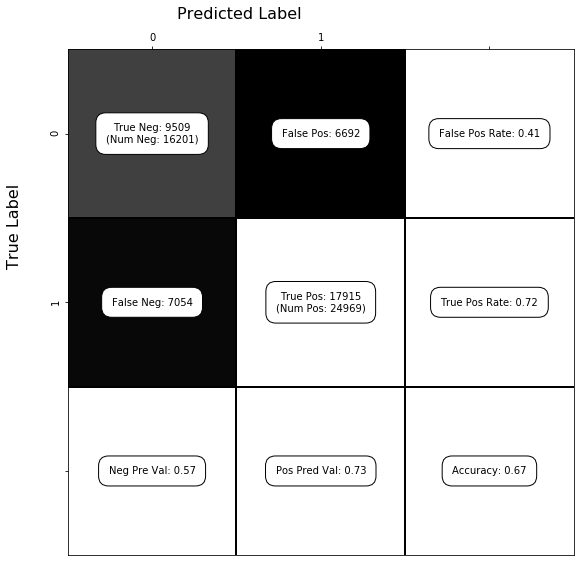

{'priors': [0.4, 0.6]}


             precision    recall  f1-score   support

          0       0.53      0.72      0.61     16201
          1       0.76      0.58      0.66     24969

avg / total       0.67      0.64      0.64     41170


Accuracy Score:  0.6353655574447413

F1 score - Binary:  0.6596998685224644

F1 score - Micro:  0.6353655574447413

F1 score - Weighted:  0.6390730609166363

Log_loss:  12.594116701262896



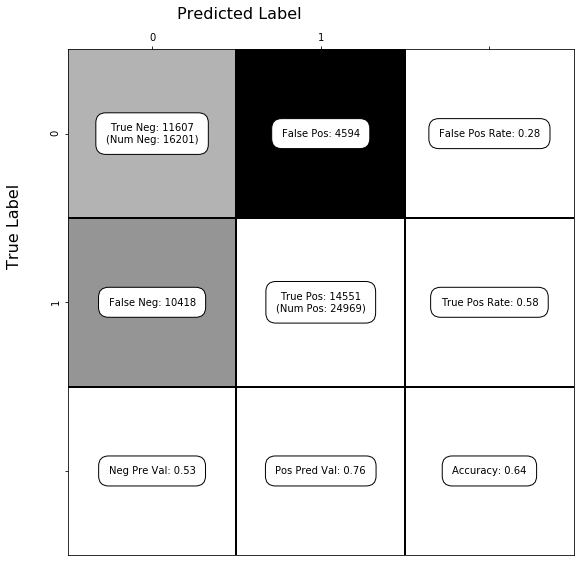

{'priors': [0.5, 0.5]}


             precision    recall  f1-score   support

          0       0.49      0.80      0.61     16201
          1       0.78      0.47      0.58     24969

avg / total       0.67      0.60      0.59     41170


Accuracy Score:  0.5972552829730386

F1 score - Binary:  0.5834861463488156

F1 score - Micro:  0.5972552829730386

F1 score - Weighted:  0.5939760846267322

Log_loss:  13.910372380503368



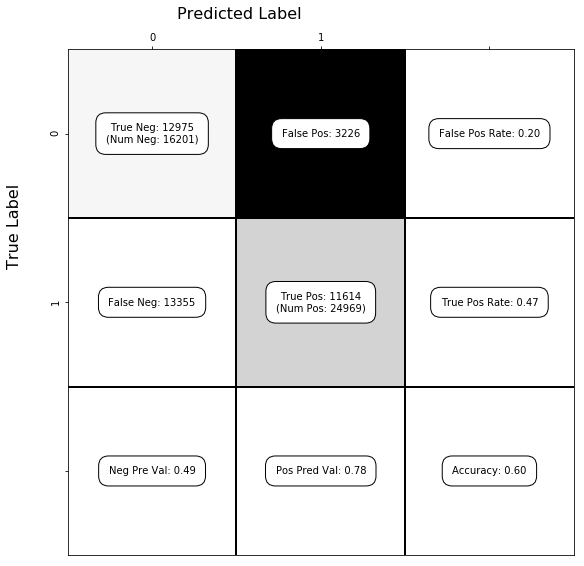

{'priors': [0.6, 0.4]}


             precision    recall  f1-score   support

          0       0.47      0.86      0.60     16201
          1       0.80      0.36      0.50     24969

avg / total       0.67      0.56      0.54     41170


Accuracy Score:  0.5587806655331552

F1 score - Binary:  0.5006185567010308

F1 score - Micro:  0.5587806655331552

F1 score - Weighted:  0.5416186361175106

Log_loss:  15.239220623931004



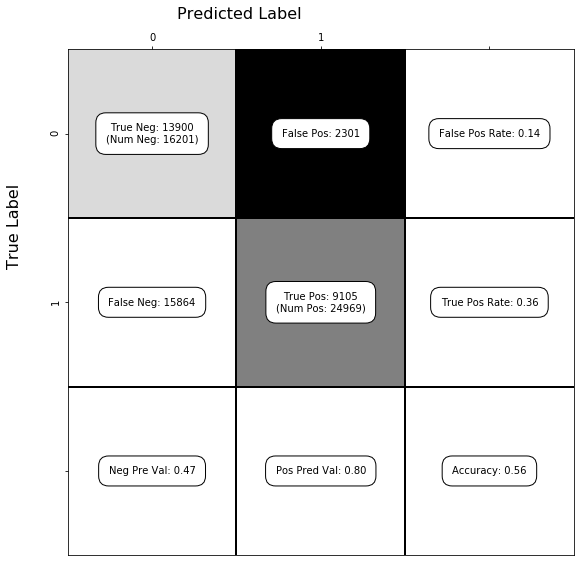

{'priors': [0.7, 0.3]}


             precision    recall  f1-score   support

          0       0.45      0.90      0.60     16201
          1       0.81      0.29      0.42     24969

avg / total       0.67      0.53      0.49     41170


Accuracy Score:  0.5278358027690065

F1 score - Binary:  0.42496672089927523

F1 score - Micro:  0.5278358027690065

F1 score - Weighted:  0.493642192017912

Log_loss:  16.308005734156445



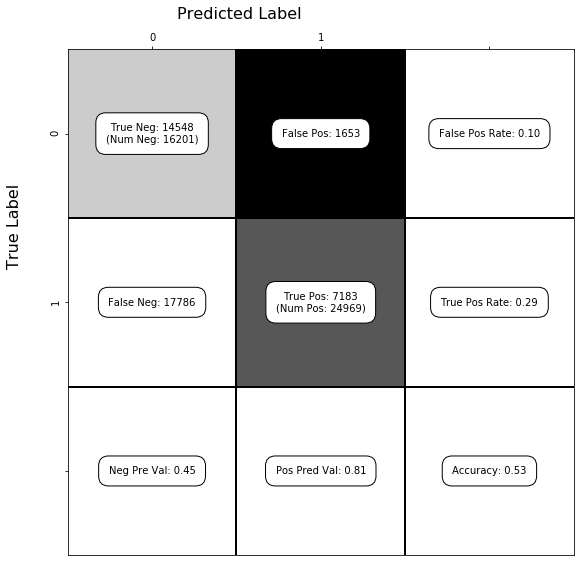

{'priors': [0.8, 0.2]}


             precision    recall  f1-score   support

          0       0.44      0.93      0.59     16201
          1       0.82      0.22      0.35     24969

avg / total       0.67      0.50      0.45     41170


Accuracy Score:  0.49890697109545784

F1 score - Binary:  0.34978567826525464

F1 score - Micro:  0.49890697109545784

F1 score - Weighted:  0.4452537121363572

Log_loss:  17.307163578817047



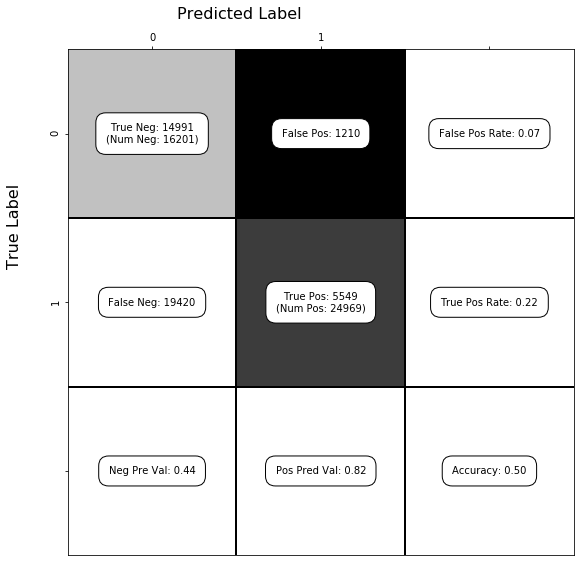

{'priors': [0.9, 0.1]}


             precision    recall  f1-score   support

          0       0.42      0.95      0.58     16201
          1       0.82      0.16      0.27     24969

avg / total       0.67      0.47      0.40     41170


Accuracy Score:  0.47133835316978384

F1 score - Binary:  0.2721466073638097

F1 score - Micro:  0.47133835316978384

F1 score - Weighted:  0.39523166081090183

Log_loss:  18.259343208331504



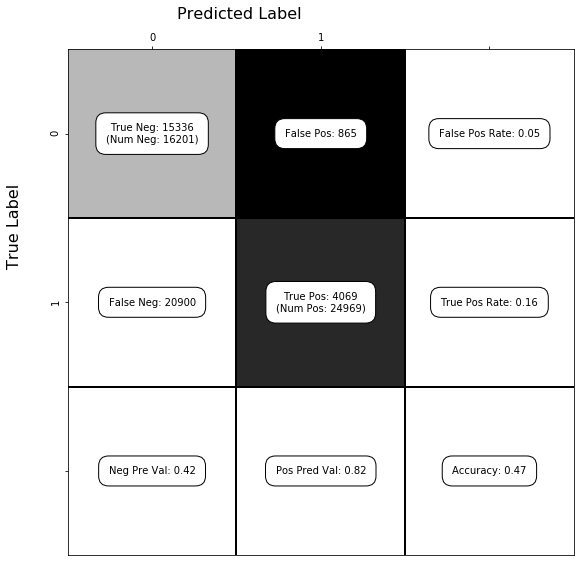

In [122]:
for param_dict in tuned_parameters:
    model = GaussianNB(priors=param_dict['priors'])
    print(param_dict)
    print()
    y_pred = cross_val_predict(model, X_train_scaled, y_test, cv=cv, n_jobs=-1)
    print()
    print(classification_report(y_train, y_pred,target_names=target_names))
    print()
    cnf_matrix = confusion_matrix(y_train, y_pred)
    print("Accuracy Score: ", np.median(accuracy_score(y_train, y_pred)))
    print()
    print("F1 score - Binary: ", np.median(f1_score(y_train, y_pred, average='binary')))
    print()
    print("F1 score - Micro: ", np.median(f1_score(y_train, y_pred, average='micro')))
    print()
    print("F1 score - Weighted: ", np.median(f1_score(y_train, y_pred, average='weighted')))
    print()
    print("Log_loss: ", metrics.log_loss(y_train, y_pred))
    print()
    show_confusion_matrix(cnf_matrix, class_labels=target_names)

## KNN

In [45]:
knn = KNeighborsClassifier()
knn.fit(X_train_scaled, y_train) 
## And score it on your testing data.
knn.score(X_test_scaled, y_test)

0.6324022346368715

## SVC w final 28 test

In [13]:
svc = LinearSVC()
svc.fit(X_train_scaled, y_train) 
LinearSVC(C=1.0, class_weight='balanced', fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000, penalty='l2', random_state=None, tol=0.0001,
     verbose=0)
svc.score(X_test_scaled, y_test)

0.6440126305562303

In [ ]:
svc = SVC()
svc.fit(X_train_scaled, y_train) 
SVC(C=1.0, kernel='rbf', degree=3, gamma='auto', shrinking=True, 
    probability=False, tol=0.0001, class_weight='balanced', 
    verbose=False, max_iter=-1, decision_function_shape='ovr', random_state=None)

In [ ]:
svc = SVC()
svc.fit(X_train_scaled, y_train) 
SVC(C=1.0, kernel='polynomial', degree=3, gamma='auto', shrinking=True, 
    probability=False, tol=0.0001, class_weight='balanced', 
    verbose=False, max_iter=-1, decision_function_shape='ovr', random_state=None)

In [ ]:
svc = SVC()
svc.fit(X_train_scaled, y_train) 
SVC(C=1.0, kernel='sigmoid', degree=3, gamma='auto', shrinking=True, 
    probability=False, tol=0.0001, class_weight='balanced', 
    verbose=False, max_iter=-1, decision_function_shape='ovr', random_state=None)

### too slow, SVC doesn't make the cut nor is it as effective as Random Forest

## XBG kills kernal

In [2]:
#from xgboost import XGBClassifier

In [56]:
'''xgb = XGBClassifier()
xgb.fit(X1_train_scaled, y1_train)
xgb.score(X1_test_scaled,y1_test)''';

## voting classifier

In [11]:
from sklearn.model_selection import GridSearchCV
clf1 = LogisticRegression(random_state=0)
clf2 = RandomForestClassifier(n_estimators=100, criterion='entropy', min_samples_split=40, class_weight='balanced', random_state=0)

eclf = VotingClassifier(estimators=[('lr', clf1), ('rf', clf2)], voting='soft')
eclf = eclf.fit(X_train_scaled, y_train)'''

In [135]:
print(eclf.predict(X_test_scaled))

[1 1 0 ... 1 1 0]


/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.



In [136]:
eclf.score(X_test_scaled, y_test)

/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.



0.7407335438426038

In [147]:
eclf.score(X_train_scaled, y_train)

/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.



0.7793862845113756

/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.

/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.

/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.

/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use

Accuracy Score:  0.7031819285887783

F1 score - Binary:  0.7368194348725018

F1 score - Micro:  0.7031819285887783

F1 score - Weighted:  0.7064662411940678

Log_loss:  10.251817619427058



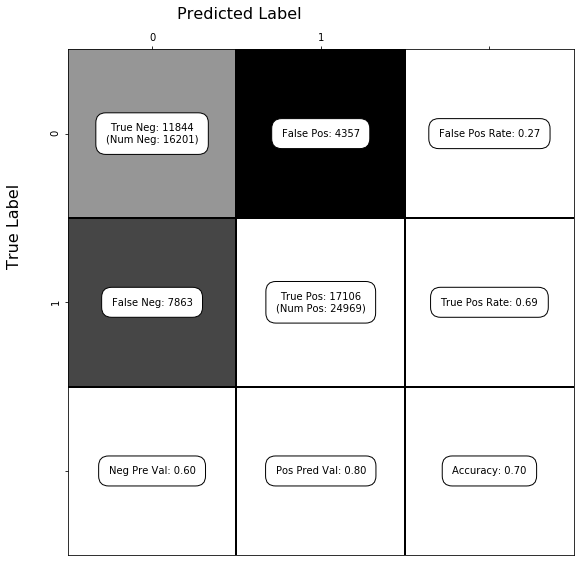

In [141]:
    y_pred = cross_val_predict(eclf, X_test_scaled, y_test, cv=cv, n_jobs=-1)
    cnf_matrix = confusion_matrix(y_test, y_pred)
    print("Accuracy Score: ", np.median(accuracy_score(y_test, y_pred)))
    print()
    print("F1 score - Binary: ", np.median(f1_score(y_test, y_pred, average='binary')))
    print()
    print("F1 score - Micro: ", np.median(f1_score(y_test, y_pred, average='micro')))
    print()
    print("F1 score - Weighted: ", np.median(f1_score(y_test, y_pred, average='weighted')))
    print()
    print("Log_loss: ", metrics.log_loss(y_test, y_pred))
    print()
    show_confusion_matrix(cnf_matrix, class_labels=target_names)

/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.

/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.

/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.

/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use

Accuracy Score:  0.7081046069144199

F1 score - Binary:  0.7419622663116608

F1 score - Micro:  0.7081046069144199

F1 score - Weighted:  0.7114795186130788

Log_loss:  10.081791789211723



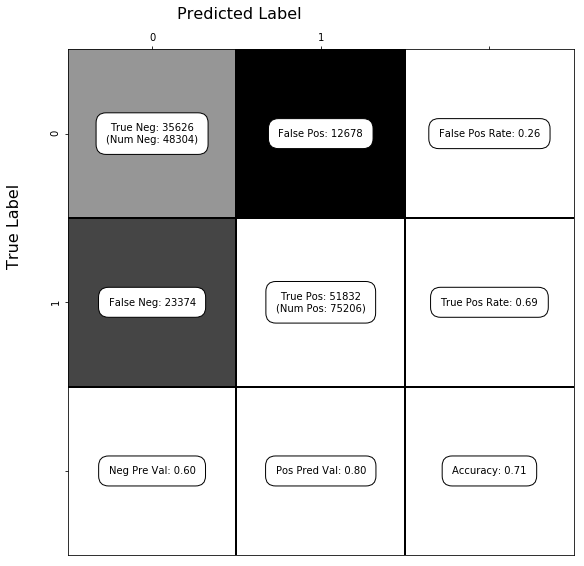

In [143]:
    y_pred = cross_val_predict(eclf, X_train_scaled, y_train, cv=cv, n_jobs=-1)
    cnf_matrix = confusion_matrix(y_train, y_pred)
    print("Accuracy Score: ", np.median(accuracy_score(y_train, y_pred)))
    print()
    print("F1 score - Binary: ", np.median(f1_score(y_train, y_pred, average='binary')))
    print()
    print("F1 score - Micro: ", np.median(f1_score(y_train, y_pred, average='micro')))
    print()
    print("F1 score - Weighted: ", np.median(f1_score(y_train, y_pred, average='weighted')))
    print()
    print("Log_loss: ", metrics.log_loss(y_train, y_pred))
    print()
    show_confusion_matrix(cnf_matrix, class_labels=target_names)

In [38]:
y = df_test['loan_status_Late'].values
df_test.drop('loan_status_Late', inplace=True, axis=1)
X = df_test.values

In [13]:
clf1 = LogisticRegression(random_state=0)
clf2 = RandomForestClassifier(n_estimators=100, criterion='entropy', min_samples_split=40, class_weight='balanced', random_state=0)

eclf = VotingClassifier(estimators=[('lr', clf1), ('rf', clf2)], voting='soft')
eclf = eclf.fit(X, y)

/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.

/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.

/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.

/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use


             precision    recall  f1-score   support

 Fully Paid       0.70      0.59      0.64     64505
       Late       0.76      0.84      0.80    100175

avg / total       0.74      0.74      0.74    164680


Accuracy Score:  0.7427192130191888

F1 score - Binary:  0.7985622798134386

F1 score - Micro:  0.7427192130191888

F1 score - Weighted:  0.7380355585894626

Log_loss:  8.886290668801939



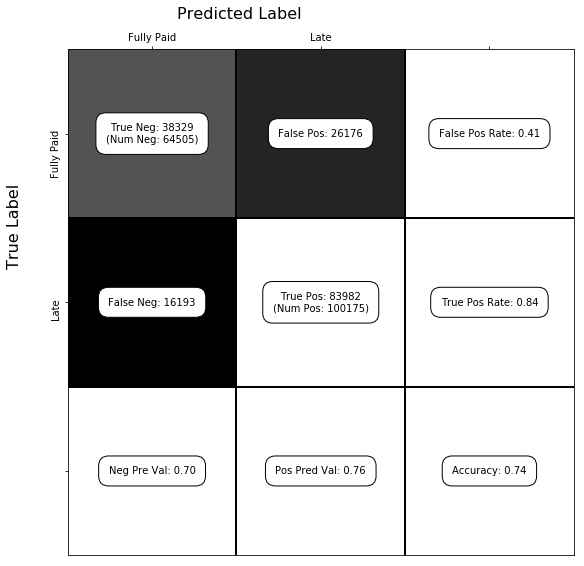

In [21]:
    y_pred = cross_val_predict(eclf, X, y, cv=cv, n_jobs=-1)
    print()
    print(classification_report(y, y_pred,target_names=target_names))
    print()
    cnf_matrix = confusion_matrix(y, y_pred)
    print("Accuracy Score: ", np.median(accuracy_score(y, y_pred)))
    print()
    print("F1 score - Binary: ", np.median(f1_score(y, y_pred, average='binary')))
    print()
    print("F1 score - Micro: ", np.median(f1_score(y, y_pred, average='micro')))
    print()
    print("F1 score - Weighted: ", np.median(f1_score(y, y_pred, average='weighted')))
    print()
    print("Log_loss: ", metrics.log_loss(y, y_pred))
    print()
    show_confusion_matrix(cnf_matrix, class_labels=target_names)

In [16]:
target_names = ['Fully Paid', 'Late']

In [27]:
list(y_pred)

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,


In [29]:
y_pred.mean()

0.6689215448141851

In [33]:
fit_object = eclf.fit(X, y)
print()

proba = cross_val_predict(eclf, X, y, cv=cv, method='predict_proba')

In [34]:
from sklearn.externals import joblib
fit_object
joblib.dump(fit_object, 'rf_final2_model.pkl')

['rf_final2_model.pkl']

In [101]:
rfe = (rf.predict(X_test_scaled))

In [ ]:
lre = (lr.predict(X_test_scaled))

In [60]:
14591/123510

0.11813618330499555

In [113]:
np.sum(abs((rfe-lre)))

14591.0

In [114]:
list(rfe-lre)

[0.0,
 0.0,
 -1.0,
 -1.0,
 0.0,
 0.0,
 -1.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 1.0,
 0.0,
 -1.0,
 0.0,
 -1.0,
 0.0,
 0.0,
 -1.0,
 -1.0,
 0.0,
 0.0,
 0.0,
 0.0,
 -1.0,
 0.0,
 -1.0,
 0.0,
 -1.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 -1.0,
 0.0,
 1.0,
 0.0,
 -1.0,
 0.0,
 -1.0,
 0.0,
 0.0,
 -1.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 -1.0,
 0.0,
 0.0,
 0.0,
 0.0,
 1.0,
 -1.0,
 -1.0,
 0.0,
 0.0,
 -1.0,
 0.0,
 0.0,
 0.0,
 -1.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 -1.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 -1.0,
 0.0,
 -1.0,
 -1.0,
 1.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 -1.0,
 0.0,
 0.0,
 0.0,
 -1.0,
 -1.0,
 0.0,
 0.0,
 0.0,
 -1.0,
 -1.0,
 -1.0,
 0.0,
 -1.0,
 0.0,
 0.0,
 1.0,
 0.0,
 0.0,
 0.0,
 -1.0,
 -1.0,
 -1.0,
 0.0,
 0.0,
 0.0,
 0.0,
 -1.0,
 0.0,
 0.0,
 0.0,
 -1.0,
 -1.0,
 0.0,
 -1.0,
 0.0,
 -1.0,
 0.0,
 -1.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 -1.0,
 -1.0,
 1.0,
 0.0,
 -1.0,
 0.0,
 0.0,
 0.0,
 0.0,
 -1.0,
 0.0,
 1.0,
 0.0,
 -1.0,
 0.0,
 0.0,
 0